# Multi-Task Learning for Joint Building Extraction and Height Estimation

This notebook implements approaches for the joint extraction of building footprints and estimation of building heights using multimodal satellite data (optical + SAR) from the 2023 IEEE GRSS Data Fusion Contest.

## Overview

1. Data Exploration & Preprocessing
2. Data Fusion Techniques
3. Multi-Task Learning Models
4. Performance Evaluation
5. Results & Analysis

## Environment Setup and Data Loading

In [56]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [57]:
pip install rasterio

Note: you may need to restart the kernel to use updated packages.


In [58]:
pip install shapely

Note: you may need to restart the kernel to use updated packages.


In [59]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [60]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [61]:
pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [62]:
pip install kagglehub

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Import necessary libraries
import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import Polygon, mapping
import cv2
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, f1_score, precision_score, recall_score, jaccard_score

# Deep learning frameworks
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from tensorflow.keras.metrics import MeanIoU

# Set random seeds for reproducibility
import random
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Set seaborn style for visualization
sns.set(style="whitegrid", font_scale=1.2)
plt.rcParams['font.family'] = 'DejaVu Sans'

# Check if GPU is available
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if len(tf.config.list_physical_devices('GPU')) > 0:
    print("Using GPU for training")
    physical_devices = tf.config.list_physical_devices('GPU')
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
else:
    print("No GPU found, using CPU")

2025-04-30 17:30:45.324413: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-30 17:30:45.533908: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746048645.615212    2871 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746048645.639902    2871 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746048645.813345    2871 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

TensorFlow version: 2.19.0
Num GPUs Available:  1
Using GPU for training


In [4]:
# Set paths for dataset
import kagglehub

# Download latest version if not already available
try:
    path = kagglehub.dataset_download("naimishmachchhar/2023-ieee-grss-data-fusion-contest")
    print("Path to dataset files:", path)
except:
    print("Dataset already downloaded or there was an issue with download.")
    # Use previously downloaded path
    path = os.path.expanduser("~/.cache/kagglehub/datasets/naimishmachchhar/2023-ieee-grss-data-fusion-contest/versions/1")
    print("Using path:", path)

# Set specific paths
track2_path = os.path.join(path, "track2")
json_file = os.path.join(track2_path, "buildings_only_train.json")
train_rgb_path = os.path.join(track2_path, "train", "rgb")
train_sar_path = os.path.join(track2_path, "train", "sar")
train_dsm_path = os.path.join(track2_path, "train", "dsm")
val_rgb_path = os.path.join(track2_path, "val", "rgb")
val_sar_path = os.path.join(track2_path, "val", "sar")
val_dsm_path = os.path.join(track2_path, "val", "dsm")

Path to dataset files: /home/saksh/.cache/kagglehub/datasets/naimishmachchhar/2023-ieee-grss-data-fusion-contest/versions/1


## Data Exploration

In [5]:
# Load annotations
with open(json_file, 'r') as f:
    json_data = json.load(f)

# Convert to dataframes
images_df = pd.DataFrame(json_data['images'])
annotations_df = pd.DataFrame(json_data['annotations'])

# Extract city from file names and add to dataframe
images_df['city'] = images_df['file_name'].apply(lambda x: x.split('_')[1] if '_' in x else 'Unknown')

# Add bounding box dimensions to annotations
annotations_df['bbox_width'] = annotations_df['bbox'].apply(lambda b: b[2])
annotations_df['bbox_height'] = annotations_df['bbox'].apply(lambda b: b[3])

# Merge annotations with image metadata
annotations_with_info = annotations_df.merge(images_df[['id', 'city', 'file_name']], left_on='image_id', right_on='id')

# Display basic statistics
print("Total number of images:", len(images_df))
print("Total number of building annotations:", len(annotations_df))
print("Cities in the dataset:", images_df['city'].unique())
print("\nBuildings per city:")
print(annotations_with_info.groupby('city').size())

Total number of images: 1773
Total number of building annotations: 125153
Cities in the dataset: ['Brasilia' 'NewDelhi' 'Barcelona' 'Berlin' 'Copenhagen' 'NewYork'
 'Portsmouth' 'Rio' 'SanDiego' 'SaoLuis' 'Sydney']

Buildings per city:
city
Barcelona     11762
Berlin        22232
Brasilia       9864
Copenhagen    15136
NewDelhi       5924
NewYork       12053
Portsmouth    19360
Rio            8836
SanDiego       9390
SaoLuis        9645
Sydney          951
dtype: int64


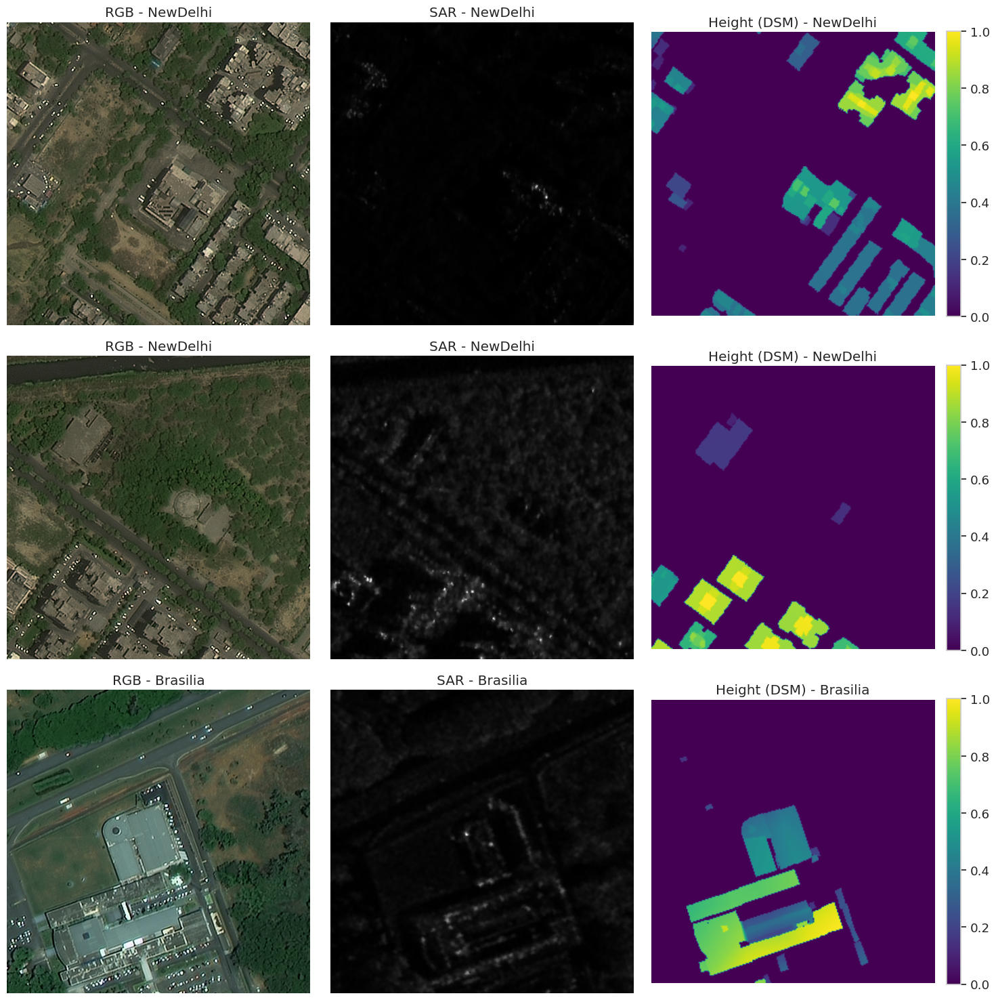

In [6]:
# Sample a few images to visualize
sample_size = 3
sample_images = images_df.sample(sample_size, random_state=42)

# Set up figure
plt.figure(figsize=(15, 5*sample_size))

for idx, (_, img_row) in enumerate(sample_images.iterrows()):
    # Get image path
    rgb_file = os.path.join(train_rgb_path, img_row['file_name'])
    sar_file = os.path.join(train_sar_path, img_row['file_name'])
    dsm_file = os.path.join(train_dsm_path, img_row['file_name'])
    
    # Load the images
    with rasterio.open(rgb_file) as src:
        rgb_img = src.read()
        rgb_img = np.transpose(rgb_img, (1, 2, 0))  # Convert to HWC format
        # Normalize to [0, 1] for display
        rgb_img = rgb_img / rgb_img.max()
    
    try:
        with rasterio.open(sar_file) as src:
            sar_img = src.read(1)
            # Normalize for display
            sar_img = (sar_img - sar_img.min()) / (sar_img.max() - sar_img.min())
    except:
        print(f"SAR image not found for {img_row['file_name']}")
        sar_img = np.zeros((512, 512))
    
    with rasterio.open(dsm_file) as src:
        dsm_img = src.read(1)
        # Normalize for display
        dsm_img = (dsm_img - dsm_img.min()) / (dsm_img.max() - dsm_img.min() + 1e-8)
    
    # Get annotations for this image
    img_annotations = annotations_df[annotations_df['image_id'] == img_row['id']]
    
    # Plot the images
    plt.subplot(sample_size, 3, idx*3 + 1)
    plt.imshow(rgb_img)
    plt.title(f"RGB - {img_row['city']}")
    plt.axis('off')
    
    plt.subplot(sample_size, 3, idx*3 + 2)
    plt.imshow(sar_img, cmap='gray')
    plt.title(f"SAR - {img_row['city']}")
    plt.axis('off')
    
    plt.subplot(sample_size, 3, idx*3 + 3)
    plt.imshow(dsm_img, cmap='viridis')
    plt.title(f"Height (DSM) - {img_row['city']}")
    plt.colorbar(fraction=0.046, pad=0.04)
    plt.axis('off')

plt.tight_layout()
plt.show()

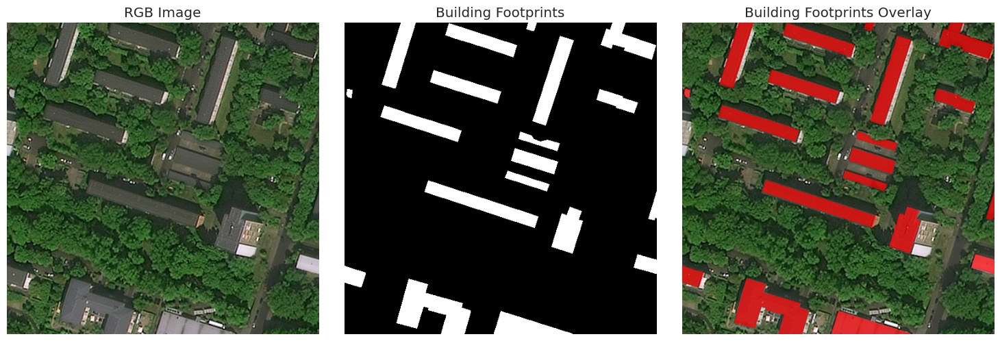

In [7]:
# Visualize building annotations on a sample image
sample_img = images_df.sample(1, random_state=24).iloc[0]
rgb_file = os.path.join(train_rgb_path, sample_img['file_name'])
dsm_file = os.path.join(train_dsm_path, sample_img['file_name'])

# Load RGB and DSM
with rasterio.open(rgb_file) as src:
    rgb_img = src.read()
    rgb_img = np.transpose(rgb_img, (1, 2, 0))
    # Normalize
    rgb_img = rgb_img / rgb_img.max()

with rasterio.open(dsm_file) as src:
    dsm_img = src.read(1)

# Get annotations for this image
img_annotations = annotations_df[annotations_df['image_id'] == sample_img['id']]

# Create binary mask for building footprints
binary_mask = np.zeros((512, 512), dtype=np.uint8)
for _, ann in img_annotations.iterrows():
    # Convert segmentation polygon to numpy array
    polygon = np.array(ann['segmentation'][0]).reshape(-1, 2).astype(np.int32)
    cv2.fillPoly(binary_mask, [polygon], 1)

# Plot
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(rgb_img)
plt.title("RGB Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(binary_mask, cmap='gray')
plt.title("Building Footprints")
plt.axis('off')

plt.subplot(1, 3, 3)
# Overlay binary mask on RGB for visualization
overlay = rgb_img.copy()
overlay_mask = np.zeros_like(rgb_img)
overlay_mask[:,:,0] = binary_mask * 0.7  # Red channel for visualization
overlay = overlay * (1 - overlay_mask[:,:,0:1]) + overlay_mask
plt.imshow(overlay)
plt.title("Building Footprints Overlay")
plt.axis('off')

plt.tight_layout()
plt.show()

## Data Preprocessing and Generator

In [8]:
# Create a data generator to load and process images in batches
class SatelliteDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_ids, images_df, annotations_df, 
                 rgb_dir, sar_dir, dsm_dir, 
                 batch_size=8, img_size=(256, 256), 
                 augment=False, shuffle=True):
        self.image_ids = image_ids
        self.images_df = images_df
        self.annotations_df = annotations_df
        self.rgb_dir = rgb_dir
        self.sar_dir = sar_dir
        self.dsm_dir = dsm_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.augment = augment
        self.shuffle = shuffle
        self.indexes = np.arange(len(self.image_ids))
        
        if self.shuffle:
            np.random.shuffle(self.indexes)
    
    def __len__(self):
        return int(np.ceil(len(self.image_ids) / self.batch_size))
    
    def __getitem__(self, idx):
        batch_indexes = self.indexes[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_ids = [self.image_ids[i] for i in batch_indexes]
        
        # Initialize batch arrays
        rgb_batch = np.zeros((len(batch_ids), self.img_size[0], self.img_size[1], 3), dtype=np.float32)
        sar_batch = np.zeros((len(batch_ids), self.img_size[0], self.img_size[1], 1), dtype=np.float32)
        mask_batch = np.zeros((len(batch_ids), self.img_size[0], self.img_size[1], 1), dtype=np.float32)
        height_batch = np.zeros((len(batch_ids), self.img_size[0], self.img_size[1], 1), dtype=np.float32)
        
        for i, img_id in enumerate(batch_ids):
            # Get image info
            img_info = self.images_df[self.images_df['id'] == img_id].iloc[0]
            
            # Get file paths
            rgb_file = os.path.join(self.rgb_dir, img_info['file_name'])
            sar_file = os.path.join(self.sar_dir, img_info['file_name'])
            dsm_file = os.path.join(self.dsm_dir, img_info['file_name'])
            
            # Load RGB
            try:
                with rasterio.open(rgb_file) as src:
                    rgb_img = src.read()
                    rgb_img = np.transpose(rgb_img, (1, 2, 0))
                    # Resize if needed
                    if rgb_img.shape[:2] != self.img_size:
                        rgb_img = cv2.resize(rgb_img, self.img_size)
                    # Normalize to [0, 1]
                    rgb_img = rgb_img / 255.0
                    rgb_batch[i] = rgb_img
            except Exception as e:
                print(f"Error loading RGB image {rgb_file}: {e}")
                
            # Load SAR
            try:
                with rasterio.open(sar_file) as src:
                    sar_img = src.read(1)
                    # Resize if needed
                    if sar_img.shape != self.img_size:
                        sar_img = cv2.resize(sar_img, self.img_size)
                    # Normalize and reshape
                    sar_img = (sar_img - sar_img.mean()) / (sar_img.std() + 1e-8)
                    sar_batch[i] = sar_img.reshape(self.img_size[0], self.img_size[1], 1)
            except Exception as e:
                print(f"Error loading SAR image {sar_file}: {e}")
                
            # Load DSM for height data
            try:
                with rasterio.open(dsm_file) as src:
                    dsm_img = src.read(1)
                    # Resize if needed
                    if dsm_img.shape != self.img_size:
                        dsm_img = cv2.resize(dsm_img, self.img_size)
                    # Normalize
                    dsm_img = (dsm_img - dsm_img.min()) / (dsm_img.max() - dsm_img.min() + 1e-8)
                    height_batch[i] = dsm_img.reshape(self.img_size[0], self.img_size[1], 1)
            except Exception as e:
                print(f"Error loading DSM image {dsm_file}: {e}")
            
            # Create building footprint mask
            mask = np.zeros(self.img_size, dtype=np.uint8)
            img_annotations = self.annotations_df[self.annotations_df['image_id'] == img_id]
            
            for _, ann in img_annotations.iterrows():
                # Check if segmentation exists and is properly formatted
                if 'segmentation' in ann and isinstance(ann['segmentation'], list) and len(ann['segmentation']) > 0:
                    # Handle different possible segmentation formats
                    if isinstance(ann['segmentation'][0], list):
                        # Format: [[x1,y1,x2,y2,...]]
                        segmentation = ann['segmentation'][0]
                    elif isinstance(ann['segmentation'], list) and all(isinstance(x, (int, float)) for x in ann['segmentation']):
                        # Format: [x1,y1,x2,y2,...]
                        segmentation = ann['segmentation']
                    else:
                        # Skip this annotation if format is not recognized
                        continue
                    
                    if len(segmentation) > 0:
                        # Make sure we have at least 3 points (6 coordinates) to form a polygon
                        if len(segmentation) >= 6:
                            polygon = np.array(segmentation).reshape(-1, 2).astype(np.int32)
                            # Scale polygon if image was resized
                            if rgb_img.shape[:2] != self.img_size:
                                scale_x = self.img_size[1] / 512
                                scale_y = self.img_size[0] / 512
                                polygon[:, 0] = polygon[:, 0] * scale_x
                                polygon[:, 1] = polygon[:, 1] * scale_y
                            # Draw filled polygon
                            cv2.fillPoly(mask, [polygon], 1)
            
            mask_batch[i] = mask.reshape(self.img_size[0], self.img_size[1], 1)
            
        # Data augmentation (if enabled)
        if self.augment:
            # Implement augmentation here (random flips, rotations, etc.)
            pass
        
        # Return a dictionary of inputs for multi-input models
        return {'rgb_input': rgb_batch, 'sar_input': sar_batch}, {'segmentation_output': mask_batch, 'height_estimation_output': height_batch}

    
    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

Training samples: 1418
Validation samples: 355
Testing data generator...
Input shapes: RGB (4, 192, 192, 3), SAR (4, 192, 192, 1)
Output shapes: Mask (4, 192, 192, 1), Height (4, 192, 192, 1)


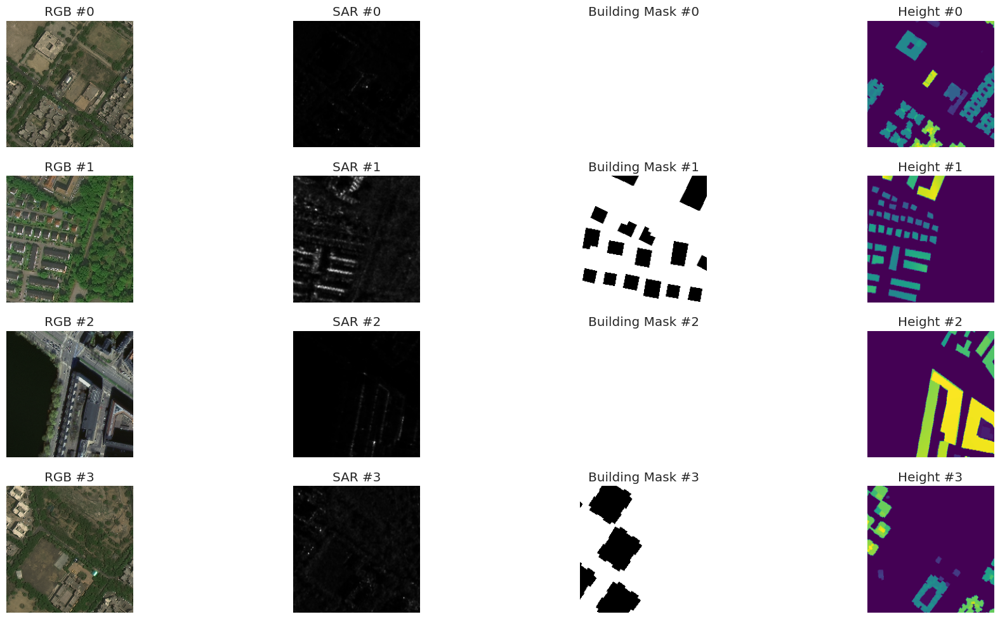

In [9]:
# Split data into train and validation sets
train_ids, valid_ids = train_test_split(images_df['id'].values, test_size=0.2, random_state=42)

print(f"Training samples: {len(train_ids)}")
print(f"Validation samples: {len(valid_ids)}")

# Create data generators
img_size = (192, 192)  # Reduce from 256x256 to 192x192 to save memory
batch_size = 4  # Reduced from 8 to 4

train_generator = SatelliteDataGenerator(
    train_ids, images_df, annotations_df,
    train_rgb_path, train_sar_path, train_dsm_path,
    batch_size=batch_size, img_size=img_size, augment=True, shuffle=True
)

valid_generator = SatelliteDataGenerator(
    valid_ids, images_df, annotations_df,
    train_rgb_path, train_sar_path, train_dsm_path,
    batch_size=batch_size, img_size=img_size, augment=False, shuffle=False
)

# Test generator
print("Testing data generator...")
X_test, y_test = train_generator[0]
print(f"Input shapes: RGB {X_test['rgb_input'].shape}, SAR {X_test['sar_input'].shape}")
print(f"Output shapes: Mask {y_test['segmentation_output'].shape}, Height {y_test['height_estimation_output'].shape}")


# Visualize a batch
plt.figure(figsize=(20, 10))
for i in range(min(4, batch_size)):
    plt.subplot(4, 4, i*4 + 1)
    plt.imshow(X_test['rgb_input'][i])
    plt.title(f"RGB #{i}")
    plt.axis('off')
    
    plt.subplot(4, 4, i*4 + 2)
    plt.imshow(X_test['sar_input'][i][:,:,0], cmap='gray')
    plt.title(f"SAR #{i}")
    plt.axis('off')
    
    plt.subplot(4, 4, i*4 + 3)
    plt.imshow(y_test['segmentation_output'][i][:,:,0], cmap='binary')
    plt.title(f"Building Mask #{i}")
    plt.axis('off')
    
    plt.subplot(4, 4, i*4 + 4)
    plt.imshow(y_test['height_estimation_output'][i][:,:,0], cmap='viridis')
    plt.title(f"Height #{i}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Data Fusion Techniques

We'll implement three different data fusion techniques:
1. Early Fusion: Concatenation of inputs at the feature level
2. Late Fusion: Separate processing networks with fusion at the decision level
3. Hybrid Fusion: Multi-level fusion throughout the network

### 1. Early Fusion Model

In [10]:
def create_early_fusion_model(input_shape_rgb=(192, 192, 3), input_shape_sar=(192, 192, 1), 
                              n_filters=48, dropout=0.3):
    """
    Create a multi-task U-Net model with early fusion of RGB and SAR data.
    Reduced number of filters to save memory.
    """
    # Enable memory growth to avoid OOM errors
    try:
        physical_devices = tf.config.list_physical_devices('GPU')
        for device in physical_devices:
            tf.config.experimental.set_memory_growth(device, True)
    except:
        print("No GPU available or error setting memory growth")
    
    # Mixed precision for better memory efficiency
    from tensorflow.keras.mixed_precision import global_policy, set_global_policy
    try:
        set_global_policy('mixed_float16')
        print("Using mixed precision training")
    except:
        print("Mixed precision training not available, using float32")
        
    # Input layers
    rgb_input = Input(shape=input_shape_rgb, name='rgb_input')
    sar_input = Input(shape=input_shape_sar, name='sar_input')
    
    # Early fusion by concatenation with channel attention
    x = tf.keras.layers.Concatenate(axis=-1)([rgb_input, sar_input])
        # Channel attention for better feature weighting
    channel_avg = layers.GlobalAveragePooling2D()(x)
    channel_max = layers.GlobalMaxPooling2D()(x)
    channel_avg = layers.Reshape((1, 1, x.shape[-1]))(channel_avg)
    channel_max = layers.Reshape((1, 1, x.shape[-1]))(channel_max)
    
    shared_dense1 = layers.Dense(x.shape[-1] // 2, activation='relu')
    shared_dense2 = layers.Dense(x.shape[-1], activation='sigmoid')
    
    avg_dense = shared_dense1(channel_avg)
    avg_dense = shared_dense2(avg_dense)
    max_dense = shared_dense1(channel_max)
    max_dense = shared_dense2(max_dense)
    
    channel_attention = layers.Add()([avg_dense, max_dense])
    x = layers.Multiply()([x, channel_attention])
    
    # Encoder
    # Block 1
    conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(x)
    conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)
    drop1 = layers.Dropout(dropout)(pool1)
    
    # Block 2
    conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(drop1)
    conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)
    drop2 = layers.Dropout(dropout)(pool2)
    
    # Block 3
    conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(drop2)
    conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)
    drop3 = layers.Dropout(dropout)(pool3)
    
    # Block 4
    conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(drop3)
    conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(conv4)
    pool4 = layers.MaxPooling2D(pool_size=(2, 2))(conv4)
    drop4 = layers.Dropout(dropout)(pool4)
    
    # Bridge
    conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(drop4)
    conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(conv5)
    
    # === Segmentation Decoder ===
    # Block 6
    up6_seg = layers.UpSampling2D(size=(2, 2))(conv5)
    merge6_seg = layers.Concatenate(axis=3)([up6_seg, conv4])
    drop6_seg = layers.Dropout(dropout)(merge6_seg)
    conv6_seg = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(drop6_seg)
    conv6_seg = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(conv6_seg)
    
    # Block 7
    up7_seg = layers.UpSampling2D(size=(2, 2))(conv6_seg)
    merge7_seg = layers.Concatenate(axis=3)([up7_seg, conv3])
    drop7_seg = layers.Dropout(dropout)(merge7_seg)
    conv7_seg = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(drop7_seg)
    conv7_seg = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(conv7_seg)
    
    # Block 8
    up8_seg = layers.UpSampling2D(size=(2, 2))(conv7_seg)
    merge8_seg = layers.Concatenate(axis=3)([up8_seg, conv2])
    drop8_seg = layers.Dropout(dropout)(merge8_seg)
    conv8_seg = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(drop8_seg)
    conv8_seg = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(conv8_seg)
    
    # Block 9
    up9_seg = layers.UpSampling2D(size=(2, 2))(conv8_seg)
    merge9_seg = layers.Concatenate(axis=3)([up9_seg, conv1])
    drop9_seg = layers.Dropout(dropout)(merge9_seg)
    conv9_seg = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(drop9_seg)
    conv9_seg = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(conv9_seg)
    
    # Segmentation output
    seg_output = layers.Conv2D(1, 1, activation='sigmoid', name='segmentation_output')(conv9_seg)
    
    # === Height Estimation Decoder ===
    # Block 6
    up6_height = layers.UpSampling2D(size=(2, 2))(conv5)
    merge6_height = layers.Concatenate(axis=3)([up6_height, conv4])
    drop6_height = layers.Dropout(dropout)(merge6_height)
    conv6_height = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(drop6_height)
    conv6_height = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(conv6_height)
    
    # Block 7
    up7_height = layers.UpSampling2D(size=(2, 2))(conv6_height)
    merge7_height = layers.Concatenate(axis=3)([up7_height, conv3])
    drop7_height = layers.Dropout(dropout)(merge7_height)
    conv7_height = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(drop7_height)
    conv7_height = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(conv7_height)
    
    # Block 8
    up8_height = layers.UpSampling2D(size=(2, 2))(conv7_height)
    merge8_height = layers.Concatenate(axis=3)([up8_height, conv2])
    drop8_height = layers.Dropout(dropout)(merge8_height)
    conv8_height = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(drop8_height)
    conv8_height = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(conv8_height)
    
    # Block 9
    up9_height = layers.UpSampling2D(size=(2, 2))(conv8_height)
    merge9_height = layers.Concatenate(axis=3)([up9_height, conv1])
    drop9_height = layers.Dropout(dropout)(merge9_height)
    conv9_height = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(drop9_height)
    conv9_height = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(conv9_height)
    
    # Height estimation output (regression)
    height_output = layers.Conv2D(1, 1, activation='linear', name='height_estimation_output')(conv9_height)
    
    # Create Model
    model = Model(inputs=[rgb_input, sar_input], outputs=[seg_output, height_output])
    
    # Compile model with different loss functions for the two tasks
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss={
            'segmentation_output': 'binary_crossentropy',
            'height_estimation_output': 'mean_squared_error'
        },
        metrics={
            'segmentation_output': [tf.keras.metrics.BinaryAccuracy(), tf.keras.metrics.IoU(num_classes=2, target_class_ids=[1])],
            'height_estimation_output': ['mae', 'mse']
        },
        loss_weights={
            'segmentation_output': 1.0,
            'height_estimation_output': 0.5
        }
    )
    
    return model

### 2. Late Fusion Model

In [11]:
def create_late_fusion_model(input_shape_rgb=(192, 192, 3), input_shape_sar=(192, 192, 1), 
                            n_filters=48, dropout=0.2):
    """
    Create a multi-task model with late fusion of RGB and SAR data.
    Processes RGB and SAR separately and fuses at the decision level.
    Reduced number of filters to save memory.
    """
    # RGB Input Branch
    rgb_input = Input(shape=input_shape_rgb, name='rgb_input')
    
    # RGB Encoder
    rgb_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(rgb_input)
    rgb_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(rgb_conv1)
    rgb_pool1 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_conv1)
    
    rgb_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(rgb_pool1)
    rgb_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(rgb_conv2)
    rgb_pool2 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_conv2)
    
    rgb_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(rgb_pool2)
    rgb_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(rgb_conv3)
    rgb_pool3 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_conv3)
    
    rgb_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(rgb_pool3)
    rgb_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(rgb_conv4)
    rgb_pool4 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_conv4)
    
    rgb_conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(rgb_pool4)
    rgb_features = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(rgb_conv5)
    
    # SAR Input Branch
    sar_input = Input(shape=input_shape_sar, name='sar_input')
    
    # SAR Encoder
    sar_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(sar_input)
    sar_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(sar_conv1)
    sar_pool1 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv1)
    
    sar_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(sar_pool1)
    sar_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(sar_conv2)
    sar_pool2 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv2)
    
    sar_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(sar_pool2)
    sar_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(sar_conv3)
    sar_pool3 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv3)
    
    sar_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(sar_pool3)
    sar_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(sar_conv4)
    sar_pool4 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv4)
    
    sar_conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(sar_pool4)
    sar_features = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(sar_conv5)
    
    # Late fusion (at the bottleneck) with attention
    # Cross-modality attention to enhance feature integration
    fused_features = layers.Concatenate(axis=-1)([rgb_features, sar_features])
    
    # Apply bottleneck attention
    attention_features = layers.Conv2D(fused_features.shape[-1] // 4, 1, activation='relu')(fused_features)
    attention_features = layers.Conv2D(fused_features.shape[-1], 1, activation='sigmoid')(attention_features)
    fused_features = layers.Multiply()([fused_features, attention_features])
    
    # Refine fused features
    fused_features = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(fused_features)
    
    # === Segmentation Decoder ===
    up6_seg = layers.UpSampling2D(size=(2, 2))(fused_features)
    merge6_seg = layers.Concatenate(axis=3)([up6_seg, layers.Concatenate(axis=-1)([rgb_conv4, sar_conv4])])
    conv6_seg = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(merge6_seg)
    conv6_seg = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(conv6_seg)
    
    up7_seg = layers.UpSampling2D(size=(2, 2))(conv6_seg)
    merge7_seg = layers.Concatenate(axis=3)([up7_seg, layers.Concatenate(axis=-1)([rgb_conv3, sar_conv3])])
    conv7_seg = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(merge7_seg)
    conv7_seg = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(conv7_seg)
    
    up8_seg = layers.UpSampling2D(size=(2, 2))(conv7_seg)
    merge8_seg = layers.Concatenate(axis=3)([up8_seg, layers.Concatenate(axis=-1)([rgb_conv2, sar_conv2])])
    conv8_seg = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(merge8_seg)
    conv8_seg = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(conv8_seg)
    
    up9_seg = layers.UpSampling2D(size=(2, 2))(conv8_seg)
    merge9_seg = layers.Concatenate(axis=3)([up9_seg, layers.Concatenate(axis=-1)([rgb_conv1, sar_conv1])])
    conv9_seg = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(merge9_seg)
    conv9_seg = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(conv9_seg)
    
    seg_output = layers.Conv2D(1, 1, activation='sigmoid', name='segmentation_output')(conv9_seg)
    
    # === Height Estimation Decoder ===
    up6_height = layers.UpSampling2D(size=(2, 2))(fused_features)
    merge6_height = layers.Concatenate(axis=3)([up6_height, layers.Concatenate(axis=-1)([rgb_conv4, sar_conv4])])
    conv6_height = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(merge6_height)
    conv6_height = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(conv6_height)
    
    up7_height = layers.UpSampling2D(size=(2, 2))(conv6_height)
    merge7_height = layers.Concatenate(axis=3)([up7_height, layers.Concatenate(axis=-1)([rgb_conv3, sar_conv3])])
    conv7_height = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(merge7_height)
    conv7_height = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(conv7_height)
    
    up8_height = layers.UpSampling2D(size=(2, 2))(conv7_height)
    merge8_height = layers.Concatenate(axis=3)([up8_height, layers.Concatenate(axis=-1)([rgb_conv2, sar_conv2])])
    conv8_height = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(merge8_height)
    conv8_height = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(conv8_height)
    
    up9_height = layers.UpSampling2D(size=(2, 2))(conv8_height)
    merge9_height = layers.Concatenate(axis=3)([up9_height, layers.Concatenate(axis=-1)([rgb_conv1, sar_conv1])])
    conv9_height = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(merge9_height)
    conv9_height = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(conv9_height)
    
    height_output = layers.Conv2D(1, 1, activation='linear', name='height_estimation_output')(conv9_height)
    
    # Create Model
    model = Model(inputs=[rgb_input, sar_input], outputs=[seg_output, height_output])
    
    # Compile model
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss={
            'segmentation_output': 'binary_crossentropy',
            'height_estimation_output': 'mean_squared_error'
        },
        metrics={
            'segmentation_output': [tf.keras.metrics.BinaryAccuracy(), tf.keras.metrics.IoU(num_classes=2, target_class_ids=[1])],
            'height_estimation_output': ['mae', 'mse']
        },
        loss_weights={
            'segmentation_output': 1.0,
            'height_estimation_output': 0.5
        }
    )
    
    return model

### 3. Hybrid Fusion Model (FuseNet)

In [12]:
def create_hybrid_fusion_model(input_shape_rgb=(192, 192, 3), input_shape_sar=(192, 192, 1), 
                              n_filters=48, dropout=0.2):
    """
    Create a multi-task model with hybrid fusion approach based on FuseNet architecture.
    Fuses RGB and SAR at multiple levels of the encoder.
    Reduced number of filters to save memory.
    """
    # Helper function for spatial attention
    def spatial_attention(input_feature, name):
        avg_pool = layers.Lambda(lambda x: tf.reduce_mean(x, axis=3, keepdims=True))(input_feature)
        max_pool = layers.Lambda(lambda x: tf.reduce_max(x, axis=3, keepdims=True))(input_feature)
        concat = layers.Concatenate()([avg_pool, max_pool])
        cbam_feature = layers.Conv2D(1, 7, padding='same', activation='sigmoid', name=f'spatial_att_{name}')(concat)
        return layers.Multiply()([input_feature, cbam_feature])
    
    # Input layers
    rgb_input = Input(shape=input_shape_rgb, name='rgb_input')
    sar_input = Input(shape=input_shape_sar, name='sar_input')
    
    # ====== ENCODER PATH ======
    
    # Level 1 - Initial convolution
    # SAR branch
    sar_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(sar_input)
    sar_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(sar_conv1)
    
    # RGB branch
    rgb_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(rgb_input)
    rgb_conv1 = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(rgb_conv1)
    
    # Fusion at level 1
    fuse1 = layers.Concatenate(axis=-1)([rgb_conv1, sar_conv1])
    fuse1_attn = spatial_attention(fuse1, 'level1')
    fuse1_conv = layers.Conv2D(n_filters, 1, activation='relu', padding='same')(fuse1_attn)
    rgb_fused1 = layers.Add()([rgb_conv1, fuse1_conv])
    
    # Pooling after level 1
    rgb_pool1 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_fused1)
    sar_pool1 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv1)
    
    # Level 2
    # SAR branch
    sar_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(sar_pool1)
    sar_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(sar_conv2)
    
    # RGB branch
    rgb_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(rgb_pool1)
    rgb_conv2 = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(rgb_conv2)
    
    # Fusion at level 2
    fuse2 = layers.Concatenate(axis=-1)([rgb_conv2, sar_conv2])
    fuse2_attn = spatial_attention(fuse2, 'level2')
    fuse2_conv = layers.Conv2D(n_filters*2, 1, activation='relu', padding='same')(fuse2_attn)
    rgb_fused2 = layers.Add()([rgb_conv2, fuse2_conv])
    
    # Pooling after level 2
    rgb_pool2 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_fused2)
    sar_pool2 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv2)
    
    # Level 3
    # SAR branch
    sar_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(sar_pool2)
    sar_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(sar_conv3)
    
    # RGB branch
    rgb_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(rgb_pool2)
    rgb_conv3 = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(rgb_conv3)
    
    # Fusion at level 3
    fuse3 = layers.Concatenate(axis=-1)([rgb_conv3, sar_conv3])
    fuse3_attn = spatial_attention(fuse3, 'level3')
    fuse3_conv = layers.Conv2D(n_filters*4, 1, activation='relu', padding='same')(fuse3_attn)
    rgb_fused3 = layers.Add()([rgb_conv3, fuse3_conv])
    
    # Pooling after level 3
    rgb_pool3 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_fused3)
    sar_pool3 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv3)
    
    # Level 4
    # SAR branch
    sar_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(sar_pool3)
    sar_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(sar_conv4)
    
    # RGB branch
    rgb_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(rgb_pool3)
    rgb_conv4 = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(rgb_conv4)
    
    # Fusion at level 4
    fuse4 = layers.Concatenate(axis=-1)([rgb_conv4, sar_conv4])
    fuse4_attn = spatial_attention(fuse4, 'level4')
    fuse4_conv = layers.Conv2D(n_filters*8, 1, activation='relu', padding='same')(fuse4_attn)
    rgb_fused4 = layers.Add()([rgb_conv4, fuse4_conv])
    
    # Pooling after level 4
    rgb_pool4 = layers.MaxPooling2D(pool_size=(2, 2))(rgb_fused4)
    sar_pool4 = layers.MaxPooling2D(pool_size=(2, 2))(sar_conv4)
    
    # Level 5 (Bridge)
    # SAR branch
    sar_conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(sar_pool4)
    sar_conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(sar_conv5)
    
    # RGB branch
    rgb_conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(rgb_pool4)
    rgb_conv5 = layers.Conv2D(n_filters*16, 3, activation='relu', padding='same')(rgb_conv5)
    
    # Final bottleneck fusion with attention
    bottle_fusion = layers.Concatenate(axis=-1)([rgb_conv5, sar_conv5])
    
    # Channel attention
    ch_pool = layers.GlobalAveragePooling2D()(bottle_fusion)
    ch_pool = layers.Reshape((1, 1, bottle_fusion.shape[-1]))(ch_pool)
    ch_pool = layers.Dense(bottle_fusion.shape[-1] // 4, activation='relu')(ch_pool)
    ch_pool = layers.Dense(bottle_fusion.shape[-1], activation='sigmoid')(ch_pool)
    bottle_ch_attn = layers.Multiply()([bottle_fusion, ch_pool])
    
    # Spatial attention
    bottle_fusion_attn = spatial_attention(bottle_ch_attn, 'bottleneck')
    
    # Final bottleneck features
    bottleneck = layers.Conv2D(n_filters*16, 1, activation='relu', padding='same')(bottle_fusion_attn)
    
    # ====== SEGMENTATION DECODER ======
    
    # Level 4 decoder
    up4_seg = layers.UpSampling2D(size=(2, 2))(bottleneck)
    merge4_seg = layers.Concatenate()([up4_seg, rgb_fused4])
    dec4_seg = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(merge4_seg)
    dec4_seg = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(dec4_seg)
    
    # Level 3 decoder
    up3_seg = layers.UpSampling2D(size=(2, 2))(dec4_seg)
    merge3_seg = layers.Concatenate()([up3_seg, rgb_fused3])
    dec3_seg = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(merge3_seg)
    dec3_seg = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(dec3_seg)
    
    # Level 2 decoder
    up2_seg = layers.UpSampling2D(size=(2, 2))(dec3_seg)
    merge2_seg = layers.Concatenate()([up2_seg, rgb_fused2])
    dec2_seg = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(merge2_seg)
    dec2_seg = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(dec2_seg)
    
    # Level 1 decoder
    up1_seg = layers.UpSampling2D(size=(2, 2))(dec2_seg)
    merge1_seg = layers.Concatenate()([up1_seg, rgb_fused1])
    dec1_seg = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(merge1_seg)
    dec1_seg = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(dec1_seg)
    
    # Segmentation output
    seg_output = layers.Conv2D(1, 1, activation='sigmoid', name='segmentation_output')(dec1_seg)
    
    # ====== HEIGHT ESTIMATION DECODER ======
    
    # Level 4 decoder
    up4_height = layers.UpSampling2D(size=(2, 2))(bottleneck)
    merge4_height = layers.Concatenate()([up4_height, rgb_fused4])
    dec4_height = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(merge4_height)
    dec4_height = layers.Conv2D(n_filters*8, 3, activation='relu', padding='same')(dec4_height)
    
    # Level 3 decoder
    up3_height = layers.UpSampling2D(size=(2, 2))(dec4_height)
    merge3_height = layers.Concatenate()([up3_height, rgb_fused3])
    dec3_height = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(merge3_height)
    dec3_height = layers.Conv2D(n_filters*4, 3, activation='relu', padding='same')(dec3_height)
    
    # Level 2 decoder
    up2_height = layers.UpSampling2D(size=(2, 2))(dec3_height)
    merge2_height = layers.Concatenate()([up2_height, rgb_fused2])
    dec2_height = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(merge2_height)
    dec2_height = layers.Conv2D(n_filters*2, 3, activation='relu', padding='same')(dec2_height)
    
    # Level 1 decoder
    up1_height = layers.UpSampling2D(size=(2, 2))(dec2_height)
    merge1_height = layers.Concatenate()([up1_height, rgb_fused1])
    dec1_height = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(merge1_height)
    dec1_height = layers.Conv2D(n_filters, 3, activation='relu', padding='same')(dec1_height)
    
    # Height estimation output
    height_output = layers.Conv2D(1, 1, activation='linear', name='height_estimation_output')(dec1_height)
    
    # Create model
    model = Model(inputs=[rgb_input, sar_input], outputs=[seg_output, height_output])
    
    # Compile model
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss={
            'segmentation_output': 'binary_crossentropy',
            'height_estimation_output': 'mean_squared_error'
        },
        metrics={
            'segmentation_output': [tf.keras.metrics.BinaryAccuracy(), tf.keras.metrics.IoU(num_classes=2, target_class_ids=[1])],
            'height_estimation_output': ['mae', 'mse']
        },
        loss_weights={
            'segmentation_output': 1.0,
            'height_estimation_output': 0.5
        }
    )
    
    return model

## Model Training and Evaluation

In [13]:
# Create the model instances
early_fusion_model = create_early_fusion_model()
late_fusion_model = create_late_fusion_model()
hybrid_fusion_model = create_hybrid_fusion_model()

# Display model summary for one of the models
early_fusion_model.summary()

# Optional: Plot model architecture
try:
    plot_model(early_fusion_model, to_file='early_fusion_model.png', show_shapes=True, show_layer_names=True)
    print("Model architecture saved to early_fusion_model.png")
    plot_model(late_fusion_model, to_file='late_fusion_model.png', show_shapes=True, show_layer_names=True)
    print("Model architecture saved to late_fusion_model.png")
    plot_model(hybrid_fusion_model, to_file='hybrid_fusion_model.png', show_shapes=True, show_layer_names=True)
    print("Model architecture saved to hybrid_fusion_model.png")
except:
    print("Failed to plot model architecture. Check if pydot and graphviz are installed.")

Using mixed precision training


I0000 00:00:1746048668.582753    2871 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5563 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ rgb_input           │ (None, 192, 192,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sar_input           │ (None, 192, 192,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cast (Cast)         │ (None, 192, 192,  │          0 │ rgb_input[0][0]   │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ cast_1 (Cast)       │ (None, 192, 192,  │          0 │ sar_input[0][0]   │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 192, 192,  │          0 │ cast[0][0],       │
│ (Concatenate)       │ 4)                │            │ cast_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 4)         │          0 │ concatenate[0][0] │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 4)         │          0 │ concatenate[0][0] │
│ (GlobalMaxPooling2… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 4)   │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 1, 1, 4)   │          0 │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1, 1, 2)   │         10 │ reshape[0][0],    │
│                     │                   │            │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1, 1, 4)   │         12 │ dense[0][0],      │
│                     │                   │            │ dense[1][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 1, 1, 4)   │          0 │ dense_1[0][0],    │
│                     │                   │            │ dense_1[1][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 192, 192,  │          0 │ concatenate[0][0… │
│                     │ 4)                │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 192, 192,  │      1,776 │ multiply[0][0]    │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 192, 192,  │     20,784 │ conv2d[0][0]      │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 96, 96,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 96, 96,    │          0 │ max_pooling2d[0]… │
│                     │ 48)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 24,704,280 (94.24 MB)

 Trainable params: 24,704,280 (94.24 MB)

 Non-trainable params: 0 (0.00 B)

Model architecture saved to early_fusion_model.png
Model architecture saved to late_fusion_model.png
Model architecture saved to hybrid_fusion_model.png


In [14]:
# Custom callbacks
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

# Create directories for model checkpoints
if not os.path.exists('models'):
    os.makedirs('models')
    print("Created 'models' directory")

# Before training, make sure we have a valid directory structure
import os
os.makedirs('models', exist_ok=True)

# Define function to clear memory between model training
def clear_memory():
    """Clear memory to prevent OOM errors"""
    import gc
    gc.collect()
    tf.keras.backend.clear_session()
    print("Memory cleared")

### Train Early Fusion Model

In [15]:
# Define checkpoints for early fusion model
early_fusion_checkpoint = ModelCheckpoint(
    'models/early_fusion_model.h5',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Try to free up memory before creating the model
clear_memory()

# Create the early fusion model with smaller parameters
early_fusion_model = create_early_fusion_model(
    input_shape_rgb=img_size + (3,),
    input_shape_sar=img_size + (1,),
    n_filters=48  # Reduced from default 64
)

# Train the early fusion model with smaller batches
early_fusion_history = early_fusion_model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=25,  # Reduced from 50 to test the training process
    callbacks=[early_stopping, reduce_lr, early_fusion_checkpoint],
    verbose=2  # Use less verbose output
)

# Save training history
early_fusion_history_df = pd.DataFrame(early_fusion_history.history)
early_fusion_history_df.to_csv('models/early_fusion_history.csv', index=False)

# Clear memory after training
clear_memory()

Memory cleared
Using mixed precision training
Epoch 1/25


/home/saksh/miniconda3/envs/tf_gpu/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1746048691.425175    3012 service.cc:152] XLA service 0x7f617c0208f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746048691.425225    3012 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-04-30 17:31:31.649208: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1746048695.893037    3012 cuda_dnn.cc:529] Loaded cuDNN version 90800
2025-04-30 17:31:51.735344


Epoch 1: val_loss improved from inf to 0.60548, saving model to models/early_fusion_model.h5


355/355 - 107s - 302ms/step - height_estimation_output_loss: 0.0651 - height_estimation_output_mae: 0.1933 - height_estimation_output_mse: 0.0651 - loss: 0.6167 - segmentation_output_binary_accuracy: 0.7458 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5839 - val_height_estimation_output_loss: 0.0612 - val_height_estimation_output_mae: 0.1845 - val_height_estimation_output_mse: 0.0612 - val_loss: 0.6055 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5750 - learning_rate: 1.0000e-04
Epoch 2/25

Epoch 2: val_loss improved from 0.60548 to 0.59415, saving model to models/early_fusion_model.h5


355/355 - 33s - 93ms/step - height_estimation_output_loss: 0.0603 - height_estimation_output_mae: 0.1784 - height_estimation_output_mse: 0.0602 - loss: 0.5906 - segmentation_output_binary_accuracy: 0.7469 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5607 - val_height_estimation_output_loss: 0.0587 - val_height_estimation_output_mae: 0.1649 - val_height_estimation_output_mse: 0.0588 - val_loss: 0.5942 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5649 - learning_rate: 1.0000e-04
Epoch 3/25

Epoch 3: val_loss improved from 0.59415 to 0.58989, saving model to models/early_fusion_model.h5


355/355 - 33s - 92ms/step - height_estimation_output_loss: 0.0577 - height_estimation_output_mae: 0.1708 - height_estimation_output_mse: 0.0577 - loss: 0.5848 - segmentation_output_binary_accuracy: 0.7469 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5560 - val_height_estimation_output_loss: 0.0568 - val_height_estimation_output_mae: 0.1547 - val_height_estimation_output_mse: 0.0568 - val_loss: 0.5899 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5617 - learning_rate: 1.0000e-04
Epoch 4/25

Epoch 4: val_loss did not improve from 0.58989
355/355 - 31s - 87ms/step - height_estimation_output_loss: 0.0545 - height_estimation_output_mae: 0.1631 - height_estimation_output_mse: 0.0545 - loss: 0.5777 - segmentation_output_binary_accuracy: 0.7469 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5506 - val_height_estimation_output_loss: 0.0595 - val_height_estimation_output

355/355 - 25s - 71ms/step - height_estimation_output_loss: 0.0529 - height_estimation_output_mae: 0.1600 - height_estimation_output_mse: 0.0529 - loss: 0.5644 - segmentation_output_binary_accuracy: 0.7473 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5379 - val_height_estimation_output_loss: 0.0550 - val_height_estimation_output_mae: 0.1450 - val_height_estimation_output_mse: 0.0551 - val_loss: 0.5770 - val_segmentation_output_binary_accuracy: 0.7413 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5497 - learning_rate: 1.0000e-04
Epoch 6/25

Epoch 6: val_loss improved from 0.57700 to 0.55079, saving model to models/early_fusion_model.h5


355/355 - 28s - 80ms/step - height_estimation_output_loss: 0.0501 - height_estimation_output_mae: 0.1536 - height_estimation_output_mse: 0.0501 - loss: 0.5489 - segmentation_output_binary_accuracy: 0.7497 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5239 - val_height_estimation_output_loss: 0.0477 - val_height_estimation_output_mae: 0.1470 - val_height_estimation_output_mse: 0.0477 - val_loss: 0.5508 - val_segmentation_output_binary_accuracy: 0.7434 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5271 - learning_rate: 1.0000e-04
Epoch 7/25

Epoch 7: val_loss did not improve from 0.55079
355/355 - 32s - 91ms/step - height_estimation_output_loss: 0.0492 - height_estimation_output_mae: 0.1514 - height_estimation_output_mse: 0.0492 - loss: 0.5488 - segmentation_output_binary_accuracy: 0.7483 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5240 - val_height_estimation_output_loss: 0.0503 - val_height_estimation_output

355/355 - 28s - 78ms/step - height_estimation_output_loss: 0.0474 - height_estimation_output_mae: 0.1469 - height_estimation_output_mse: 0.0474 - loss: 0.5355 - segmentation_output_binary_accuracy: 0.7508 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5116 - val_height_estimation_output_loss: 0.0458 - val_height_estimation_output_mae: 0.1411 - val_height_estimation_output_mse: 0.0458 - val_loss: 0.5444 - val_segmentation_output_binary_accuracy: 0.7448 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5216 - learning_rate: 1.0000e-04
Epoch 9/25

Epoch 9: val_loss improved from 0.54435 to 0.53953, saving model to models/early_fusion_model.h5


355/355 - 27s - 75ms/step - height_estimation_output_loss: 0.0453 - height_estimation_output_mae: 0.1420 - height_estimation_output_mse: 0.0453 - loss: 0.5273 - segmentation_output_binary_accuracy: 0.7534 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5045 - val_height_estimation_output_loss: 0.0448 - val_height_estimation_output_mae: 0.1340 - val_height_estimation_output_mse: 0.0448 - val_loss: 0.5395 - val_segmentation_output_binary_accuracy: 0.7459 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5172 - learning_rate: 1.0000e-04
Epoch 10/25

Epoch 10: val_loss improved from 0.53953 to 0.53805, saving model to models/early_fusion_model.h5


355/355 - 27s - 75ms/step - height_estimation_output_loss: 0.0447 - height_estimation_output_mae: 0.1402 - height_estimation_output_mse: 0.0448 - loss: 0.5224 - segmentation_output_binary_accuracy: 0.7547 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4999 - val_height_estimation_output_loss: 0.0444 - val_height_estimation_output_mae: 0.1371 - val_height_estimation_output_mse: 0.0444 - val_loss: 0.5381 - val_segmentation_output_binary_accuracy: 0.7440 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5160 - learning_rate: 1.0000e-04
Epoch 11/25

Epoch 11: val_loss improved from 0.53805 to 0.53532, saving model to models/early_fusion_model.h5


355/355 - 24s - 68ms/step - height_estimation_output_loss: 0.0436 - height_estimation_output_mae: 0.1375 - height_estimation_output_mse: 0.0436 - loss: 0.5202 - segmentation_output_binary_accuracy: 0.7561 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4982 - val_height_estimation_output_loss: 0.0454 - val_height_estimation_output_mae: 0.1405 - val_height_estimation_output_mse: 0.0454 - val_loss: 0.5353 - val_segmentation_output_binary_accuracy: 0.7474 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5127 - learning_rate: 1.0000e-04
Epoch 12/25

Epoch 12: val_loss improved from 0.53532 to 0.52987, saving model to models/early_fusion_model.h5


355/355 - 27s - 75ms/step - height_estimation_output_loss: 0.0464 - height_estimation_output_mae: 0.1430 - height_estimation_output_mse: 0.0464 - loss: 0.5201 - segmentation_output_binary_accuracy: 0.7558 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4969 - val_height_estimation_output_loss: 0.0436 - val_height_estimation_output_mae: 0.1393 - val_height_estimation_output_mse: 0.0436 - val_loss: 0.5299 - val_segmentation_output_binary_accuracy: 0.7470 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5082 - learning_rate: 1.0000e-04
Epoch 13/25

Epoch 13: val_loss improved from 0.52987 to 0.52845, saving model to models/early_fusion_model.h5


355/355 - 26s - 74ms/step - height_estimation_output_loss: 0.0428 - height_estimation_output_mae: 0.1355 - height_estimation_output_mse: 0.0428 - loss: 0.5127 - segmentation_output_binary_accuracy: 0.7552 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4917 - val_height_estimation_output_loss: 0.0452 - val_height_estimation_output_mae: 0.1303 - val_height_estimation_output_mse: 0.0452 - val_loss: 0.5285 - val_segmentation_output_binary_accuracy: 0.7478 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5060 - learning_rate: 1.0000e-04
Epoch 14/25

Epoch 14: val_loss improved from 0.52845 to 0.52774, saving model to models/early_fusion_model.h5


355/355 - 26s - 73ms/step - height_estimation_output_loss: 0.0418 - height_estimation_output_mae: 0.1328 - height_estimation_output_mse: 0.0419 - loss: 0.5040 - segmentation_output_binary_accuracy: 0.7592 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4828 - val_height_estimation_output_loss: 0.0417 - val_height_estimation_output_mae: 0.1321 - val_height_estimation_output_mse: 0.0418 - val_loss: 0.5277 - val_segmentation_output_binary_accuracy: 0.7496 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5069 - learning_rate: 1.0000e-04
Epoch 15/25

Epoch 15: val_loss improved from 0.52774 to 0.52420, saving model to models/early_fusion_model.h5


355/355 - 24s - 68ms/step - height_estimation_output_loss: 0.0422 - height_estimation_output_mae: 0.1337 - height_estimation_output_mse: 0.0422 - loss: 0.5016 - segmentation_output_binary_accuracy: 0.7595 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4807 - val_height_estimation_output_loss: 0.0417 - val_height_estimation_output_mae: 0.1316 - val_height_estimation_output_mse: 0.0417 - val_loss: 0.5242 - val_segmentation_output_binary_accuracy: 0.7501 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5034 - learning_rate: 1.0000e-04
Epoch 16/25

Epoch 16: val_loss improved from 0.52420 to 0.52191, saving model to models/early_fusion_model.h5


355/355 - 26s - 75ms/step - height_estimation_output_loss: 0.0403 - height_estimation_output_mae: 0.1294 - height_estimation_output_mse: 0.0403 - loss: 0.4956 - segmentation_output_binary_accuracy: 0.7617 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4757 - val_height_estimation_output_loss: 0.0400 - val_height_estimation_output_mae: 0.1249 - val_height_estimation_output_mse: 0.0400 - val_loss: 0.5219 - val_segmentation_output_binary_accuracy: 0.7508 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5020 - learning_rate: 1.0000e-04
Epoch 17/25

Epoch 17: val_loss did not improve from 0.52191
355/355 - 26s - 74ms/step - height_estimation_output_loss: 0.0388 - height_estimation_output_mae: 0.1254 - height_estimation_output_mse: 0.0388 - loss: 0.4843 - segmentation_output_binary_accuracy: 0.7646 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4647 - val_height_estimation_output_loss: 0.0394 - val_height_estimation_outp

355/355 - 27s - 75ms/step - height_estimation_output_loss: 0.0380 - height_estimation_output_mae: 0.1236 - height_estimation_output_mse: 0.0381 - loss: 0.4800 - segmentation_output_binary_accuracy: 0.7655 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4608 - val_height_estimation_output_loss: 0.0402 - val_height_estimation_output_mae: 0.1318 - val_height_estimation_output_mse: 0.0402 - val_loss: 0.5182 - val_segmentation_output_binary_accuracy: 0.7526 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4982 - learning_rate: 1.0000e-04
Epoch 19/25

Epoch 19: val_loss did not improve from 0.51824
355/355 - 24s - 69ms/step - height_estimation_output_loss: 0.0372 - height_estimation_output_mae: 0.1214 - height_estimation_output_mse: 0.0372 - loss: 0.4713 - segmentation_output_binary_accuracy: 0.7696 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4528 - val_height_estimation_output_loss: 0.0382 - val_height_estimation_outp

### Train Late Fusion Model

In [18]:
# Define checkpoints for late fusion model
late_fusion_checkpoint = ModelCheckpoint(
    'models/late_fusion_model.h5',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Try to free up memory before creating the model
clear_memory()

# Create the late fusion model with smaller parameters
late_fusion_model = create_late_fusion_model(
    input_shape_rgb=img_size + (3,),
    input_shape_sar=img_size + (1,),
    n_filters=48  # Reduced from default 64
)

# Train the late fusion model with smaller batches
late_fusion_history = late_fusion_model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=25,  # Reduced from 50 to test the training process
    callbacks=[early_stopping, reduce_lr, late_fusion_checkpoint],
    verbose=2  # Use less verbose output
)

# Save training history
late_fusion_history_df = pd.DataFrame(late_fusion_history.history)
late_fusion_history_df.to_csv('models/late_fusion_history.csv', index=False)

# Clear memory after training
clear_memory()

Memory cleared
Epoch 1/25

Epoch 1: val_loss improved from inf to 0.59569, saving model to models/late_fusion_model.h5


355/355 - 101s - 285ms/step - height_estimation_output_loss: 0.0590 - height_estimation_output_mae: 0.1780 - height_estimation_output_mse: 0.0590 - loss: 0.6073 - segmentation_output_binary_accuracy: 0.7469 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5779 - val_height_estimation_output_loss: 0.0546 - val_height_estimation_output_mae: 0.1729 - val_height_estimation_output_mse: 0.0546 - val_loss: 0.5957 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5685 - learning_rate: 1.0000e-04
Epoch 2/25

Epoch 2: val_loss improved from 0.59569 to 0.58246, saving model to models/late_fusion_model.h5


355/355 - 75s - 212ms/step - height_estimation_output_loss: 0.0531 - height_estimation_output_mae: 0.1578 - height_estimation_output_mse: 0.0530 - loss: 0.5815 - segmentation_output_binary_accuracy: 0.7470 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5552 - val_height_estimation_output_loss: 0.0509 - val_height_estimation_output_mae: 0.1590 - val_height_estimation_output_mse: 0.0509 - val_loss: 0.5825 - val_segmentation_output_binary_accuracy: 0.7415 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5572 - learning_rate: 1.0000e-04
Epoch 3/25

Epoch 3: val_loss did not improve from 0.58246
355/355 - 82s - 232ms/step - height_estimation_output_loss: 0.0500 - height_estimation_output_mae: 0.1522 - height_estimation_output_mse: 0.0501 - loss: 0.5719 - segmentation_output_binary_accuracy: 0.7468 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5469 - val_height_estimation_output_loss: 0.0501 - val_height_estimation_outp

355/355 - 102s - 286ms/step - height_estimation_output_loss: 0.0464 - height_estimation_output_mae: 0.1434 - height_estimation_output_mse: 0.0464 - loss: 0.5565 - segmentation_output_binary_accuracy: 0.7485 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5334 - val_height_estimation_output_loss: 0.0450 - val_height_estimation_output_mae: 0.1411 - val_height_estimation_output_mse: 0.0451 - val_loss: 0.5589 - val_segmentation_output_binary_accuracy: 0.7419 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5366 - learning_rate: 1.0000e-04
Epoch 5/25

Epoch 5: val_loss improved from 0.55888 to 0.54916, saving model to models/late_fusion_model.h5


355/355 - 102s - 289ms/step - height_estimation_output_loss: 0.0440 - height_estimation_output_mae: 0.1385 - height_estimation_output_mse: 0.0440 - loss: 0.5395 - segmentation_output_binary_accuracy: 0.7508 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5177 - val_height_estimation_output_loss: 0.0457 - val_height_estimation_output_mae: 0.1428 - val_height_estimation_output_mse: 0.0457 - val_loss: 0.5492 - val_segmentation_output_binary_accuracy: 0.7457 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5265 - learning_rate: 1.0000e-04
Epoch 6/25

Epoch 6: val_loss improved from 0.54916 to 0.54288, saving model to models/late_fusion_model.h5


355/355 - 102s - 288ms/step - height_estimation_output_loss: 0.0426 - height_estimation_output_mae: 0.1351 - height_estimation_output_mse: 0.0426 - loss: 0.5346 - segmentation_output_binary_accuracy: 0.7529 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5132 - val_height_estimation_output_loss: 0.0416 - val_height_estimation_output_mae: 0.1291 - val_height_estimation_output_mse: 0.0417 - val_loss: 0.5429 - val_segmentation_output_binary_accuracy: 0.7467 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5221 - learning_rate: 1.0000e-04
Epoch 7/25

Epoch 7: val_loss improved from 0.54288 to 0.53713, saving model to models/late_fusion_model.h5


355/355 - 102s - 287ms/step - height_estimation_output_loss: 0.0411 - height_estimation_output_mae: 0.1305 - height_estimation_output_mse: 0.0411 - loss: 0.5219 - segmentation_output_binary_accuracy: 0.7559 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5011 - val_height_estimation_output_loss: 0.0421 - val_height_estimation_output_mae: 0.1390 - val_height_estimation_output_mse: 0.0421 - val_loss: 0.5371 - val_segmentation_output_binary_accuracy: 0.7472 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5163 - learning_rate: 1.0000e-04
Epoch 8/25

Epoch 8: val_loss improved from 0.53713 to 0.52540, saving model to models/late_fusion_model.h5


355/355 - 110s - 309ms/step - height_estimation_output_loss: 0.0397 - height_estimation_output_mae: 0.1273 - height_estimation_output_mse: 0.0397 - loss: 0.5096 - segmentation_output_binary_accuracy: 0.7563 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4898 - val_height_estimation_output_loss: 0.0386 - val_height_estimation_output_mae: 0.1250 - val_height_estimation_output_mse: 0.0386 - val_loss: 0.5254 - val_segmentation_output_binary_accuracy: 0.7486 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5061 - learning_rate: 1.0000e-04
Epoch 9/25

Epoch 9: val_loss improved from 0.52540 to 0.51545, saving model to models/late_fusion_model.h5


355/355 - 123s - 346ms/step - height_estimation_output_loss: 0.0383 - height_estimation_output_mae: 0.1235 - height_estimation_output_mse: 0.0383 - loss: 0.4982 - segmentation_output_binary_accuracy: 0.7601 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4792 - val_height_estimation_output_loss: 0.0375 - val_height_estimation_output_mae: 0.1213 - val_height_estimation_output_mse: 0.0375 - val_loss: 0.5154 - val_segmentation_output_binary_accuracy: 0.7519 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4968 - learning_rate: 1.0000e-04
Epoch 10/25

Epoch 10: val_loss did not improve from 0.51545
355/355 - 120s - 337ms/step - height_estimation_output_loss: 0.0373 - height_estimation_output_mae: 0.1213 - height_estimation_output_mse: 0.0374 - loss: 0.4915 - segmentation_output_binary_accuracy: 0.7596 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4728 - val_height_estimation_output_loss: 0.0379 - val_height_estimation_

355/355 - 119s - 336ms/step - height_estimation_output_loss: 0.0354 - height_estimation_output_mae: 0.1166 - height_estimation_output_mse: 0.0354 - loss: 0.4791 - segmentation_output_binary_accuracy: 0.7649 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4611 - val_height_estimation_output_loss: 0.0358 - val_height_estimation_output_mae: 0.1128 - val_height_estimation_output_mse: 0.0358 - val_loss: 0.5091 - val_segmentation_output_binary_accuracy: 0.7556 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4913 - learning_rate: 1.0000e-04
Epoch 12/25

Epoch 12: val_loss did not improve from 0.50908
355/355 - 119s - 336ms/step - height_estimation_output_loss: 0.0355 - height_estimation_output_mae: 0.1162 - height_estimation_output_mse: 0.0355 - loss: 0.4699 - segmentation_output_binary_accuracy: 0.7703 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4525 - val_height_estimation_output_loss: 0.0373 - val_height_estimation_

355/355 - 121s - 342ms/step - height_estimation_output_loss: 0.0333 - height_estimation_output_mae: 0.1113 - height_estimation_output_mse: 0.0333 - loss: 0.4555 - segmentation_output_binary_accuracy: 0.7756 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4388 - val_height_estimation_output_loss: 0.0361 - val_height_estimation_output_mae: 0.1126 - val_height_estimation_output_mse: 0.0361 - val_loss: 0.5022 - val_segmentation_output_binary_accuracy: 0.7600 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4844 - learning_rate: 1.0000e-04
Epoch 14/25

Epoch 14: val_loss improved from 0.50224 to 0.49552, saving model to models/late_fusion_model.h5


355/355 - 126s - 354ms/step - height_estimation_output_loss: 0.0322 - height_estimation_output_mae: 0.1082 - height_estimation_output_mse: 0.0322 - loss: 0.4384 - segmentation_output_binary_accuracy: 0.7853 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4221 - val_height_estimation_output_loss: 0.0344 - val_height_estimation_output_mae: 0.1096 - val_height_estimation_output_mse: 0.0344 - val_loss: 0.4955 - val_segmentation_output_binary_accuracy: 0.7607 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4785 - learning_rate: 1.0000e-04
Epoch 15/25

Epoch 15: val_loss improved from 0.49552 to 0.48323, saving model to models/late_fusion_model.h5


355/355 - 125s - 352ms/step - height_estimation_output_loss: 0.0311 - height_estimation_output_mae: 0.1056 - height_estimation_output_mse: 0.0311 - loss: 0.4193 - segmentation_output_binary_accuracy: 0.7942 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4038 - val_height_estimation_output_loss: 0.0327 - val_height_estimation_output_mae: 0.1086 - val_height_estimation_output_mse: 0.0327 - val_loss: 0.4832 - val_segmentation_output_binary_accuracy: 0.7640 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4670 - learning_rate: 1.0000e-04
Epoch 16/25

Epoch 16: val_loss did not improve from 0.48323
355/355 - 123s - 346ms/step - height_estimation_output_loss: 0.0297 - height_estimation_output_mae: 0.1022 - height_estimation_output_mse: 0.0297 - loss: 0.4012 - segmentation_output_binary_accuracy: 0.8057 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.3862 - val_height_estimation_output_loss: 0.0339 - val_height_estimation_

### Train Hybrid Fusion Model

In [20]:
# Define checkpoints for hybrid fusion model
hybrid_fusion_checkpoint = ModelCheckpoint(
    'models/hybrid_fusion_model.h5',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Try to free up memory before creating the model
clear_memory()

# Create the hybrid fusion model with smaller parameters
hybrid_fusion_model = create_hybrid_fusion_model(
    input_shape_rgb=img_size + (3,),
    input_shape_sar=img_size + (1,),
    n_filters=48  # Reduced from default 64
)

# Train the hybrid fusion model with smaller batches
hybrid_fusion_history = hybrid_fusion_model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=25,  # Reduced from 50 to test the training process 
    callbacks=[early_stopping, reduce_lr, hybrid_fusion_checkpoint],
    verbose=2  # Use less verbose output
)

# Save training history
hybrid_fusion_history_df = pd.DataFrame(hybrid_fusion_history.history)
hybrid_fusion_history_df.to_csv('models/hybrid_fusion_history.csv', index=False)

# Clear memory after training
clear_memory()

Memory cleared
Epoch 1/25

Epoch 1: val_loss improved from inf to 0.59126, saving model to models/hybrid_fusion_model.h5


355/355 - 104s - 293ms/step - height_estimation_output_loss: 0.0595 - height_estimation_output_mae: 0.1778 - height_estimation_output_mse: 0.0595 - loss: 0.6050 - segmentation_output_binary_accuracy: 0.7468 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5753 - val_height_estimation_output_loss: 0.0534 - val_height_estimation_output_mae: 0.1587 - val_height_estimation_output_mse: 0.0534 - val_loss: 0.5913 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5647 - learning_rate: 1.0000e-04
Epoch 2/25

Epoch 2: val_loss improved from 0.59126 to 0.58512, saving model to models/hybrid_fusion_model.h5


355/355 - 65s - 182ms/step - height_estimation_output_loss: 0.0527 - height_estimation_output_mae: 0.1586 - height_estimation_output_mse: 0.0527 - loss: 0.5800 - segmentation_output_binary_accuracy: 0.7469 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5535 - val_height_estimation_output_loss: 0.0507 - val_height_estimation_output_mae: 0.1523 - val_height_estimation_output_mse: 0.0507 - val_loss: 0.5851 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5600 - learning_rate: 1.0000e-04
Epoch 3/25

Epoch 3: val_loss improved from 0.58512 to 0.57914, saving model to models/hybrid_fusion_model.h5


355/355 - 64s - 180ms/step - height_estimation_output_loss: 0.0488 - height_estimation_output_mae: 0.1506 - height_estimation_output_mse: 0.0488 - loss: 0.5748 - segmentation_output_binary_accuracy: 0.7474 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5506 - val_height_estimation_output_loss: 0.0471 - val_height_estimation_output_mae: 0.1465 - val_height_estimation_output_mse: 0.0471 - val_loss: 0.5791 - val_segmentation_output_binary_accuracy: 0.7411 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5558 - learning_rate: 1.0000e-04
Epoch 4/25

Epoch 4: val_loss did not improve from 0.57914
355/355 - 59s - 167ms/step - height_estimation_output_loss: 0.0465 - height_estimation_output_mae: 0.1450 - height_estimation_output_mse: 0.0465 - loss: 0.5639 - segmentation_output_binary_accuracy: 0.7487 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5406 - val_height_estimation_output_loss: 0.0491 - val_height_estimation_outp

355/355 - 64s - 179ms/step - height_estimation_output_loss: 0.0458 - height_estimation_output_mae: 0.1426 - height_estimation_output_mse: 0.0457 - loss: 0.5497 - segmentation_output_binary_accuracy: 0.7500 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5270 - val_height_estimation_output_loss: 0.0492 - val_height_estimation_output_mae: 0.1626 - val_height_estimation_output_mse: 0.0492 - val_loss: 0.5781 - val_segmentation_output_binary_accuracy: 0.7419 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5537 - learning_rate: 1.0000e-04
Epoch 6/25

Epoch 6: val_loss improved from 0.57810 to 0.55631, saving model to models/hybrid_fusion_model.h5


355/355 - 64s - 179ms/step - height_estimation_output_loss: 0.0457 - height_estimation_output_mae: 0.1417 - height_estimation_output_mse: 0.0457 - loss: 0.5386 - segmentation_output_binary_accuracy: 0.7516 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5156 - val_height_estimation_output_loss: 0.0507 - val_height_estimation_output_mae: 0.1533 - val_height_estimation_output_mse: 0.0506 - val_loss: 0.5563 - val_segmentation_output_binary_accuracy: 0.7441 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5312 - learning_rate: 1.0000e-04
Epoch 7/25

Epoch 7: val_loss improved from 0.55631 to 0.53863, saving model to models/hybrid_fusion_model.h5


355/355 - 64s - 180ms/step - height_estimation_output_loss: 0.0431 - height_estimation_output_mae: 0.1370 - height_estimation_output_mse: 0.0431 - loss: 0.5269 - segmentation_output_binary_accuracy: 0.7553 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.5056 - val_height_estimation_output_loss: 0.0423 - val_height_estimation_output_mae: 0.1323 - val_height_estimation_output_mse: 0.0423 - val_loss: 0.5386 - val_segmentation_output_binary_accuracy: 0.7451 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5176 - learning_rate: 1.0000e-04
Epoch 8/25

Epoch 8: val_loss did not improve from 0.53863
355/355 - 63s - 179ms/step - height_estimation_output_loss: 0.0421 - height_estimation_output_mae: 0.1332 - height_estimation_output_mse: 0.0421 - loss: 0.5191 - segmentation_output_binary_accuracy: 0.7561 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4982 - val_height_estimation_output_loss: 0.0417 - val_height_estimation_outp

355/355 - 63s - 177ms/step - height_estimation_output_loss: 0.0415 - height_estimation_output_mae: 0.1316 - height_estimation_output_mse: 0.0415 - loss: 0.5149 - segmentation_output_binary_accuracy: 0.7562 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4940 - val_height_estimation_output_loss: 0.0416 - val_height_estimation_output_mae: 0.1293 - val_height_estimation_output_mse: 0.0416 - val_loss: 0.5379 - val_segmentation_output_binary_accuracy: 0.7462 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5173 - learning_rate: 1.0000e-04
Epoch 10/25

Epoch 10: val_loss improved from 0.53794 to 0.52982, saving model to models/hybrid_fusion_model.h5


355/355 - 64s - 182ms/step - height_estimation_output_loss: 0.0396 - height_estimation_output_mae: 0.1274 - height_estimation_output_mse: 0.0396 - loss: 0.5096 - segmentation_output_binary_accuracy: 0.7572 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4902 - val_height_estimation_output_loss: 0.0395 - val_height_estimation_output_mae: 0.1204 - val_height_estimation_output_mse: 0.0395 - val_loss: 0.5298 - val_segmentation_output_binary_accuracy: 0.7479 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5102 - learning_rate: 1.0000e-04
Epoch 11/25

Epoch 11: val_loss improved from 0.52982 to 0.52888, saving model to models/hybrid_fusion_model.h5


355/355 - 64s - 181ms/step - height_estimation_output_loss: 0.0381 - height_estimation_output_mae: 0.1233 - height_estimation_output_mse: 0.0382 - loss: 0.4975 - segmentation_output_binary_accuracy: 0.7600 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4784 - val_height_estimation_output_loss: 0.0421 - val_height_estimation_output_mae: 0.1219 - val_height_estimation_output_mse: 0.0421 - val_loss: 0.5289 - val_segmentation_output_binary_accuracy: 0.7466 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5079 - learning_rate: 1.0000e-04
Epoch 12/25

Epoch 12: val_loss improved from 0.52888 to 0.52259, saving model to models/hybrid_fusion_model.h5


355/355 - 65s - 184ms/step - height_estimation_output_loss: 0.0375 - height_estimation_output_mae: 0.1213 - height_estimation_output_mse: 0.0375 - loss: 0.4875 - segmentation_output_binary_accuracy: 0.7621 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4689 - val_height_estimation_output_loss: 0.0378 - val_height_estimation_output_mae: 0.1268 - val_height_estimation_output_mse: 0.0378 - val_loss: 0.5226 - val_segmentation_output_binary_accuracy: 0.7486 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5038 - learning_rate: 1.0000e-04
Epoch 13/25

Epoch 13: val_loss did not improve from 0.52259
355/355 - 63s - 179ms/step - height_estimation_output_loss: 0.0363 - height_estimation_output_mae: 0.1186 - height_estimation_output_mse: 0.0363 - loss: 0.4775 - segmentation_output_binary_accuracy: 0.7660 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4592 - val_height_estimation_output_loss: 0.0382 - val_height_estimation_ou

355/355 - 64s - 180ms/step - height_estimation_output_loss: 0.0344 - height_estimation_output_mae: 0.1140 - height_estimation_output_mse: 0.0344 - loss: 0.4599 - segmentation_output_binary_accuracy: 0.7737 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4424 - val_height_estimation_output_loss: 0.0365 - val_height_estimation_output_mae: 0.1177 - val_height_estimation_output_mse: 0.0365 - val_loss: 0.5196 - val_segmentation_output_binary_accuracy: 0.7448 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.5014 - learning_rate: 1.0000e-04
Epoch 16/25

Epoch 16: val_loss improved from 0.51963 to 0.51451, saving model to models/hybrid_fusion_model.h5


355/355 - 65s - 182ms/step - height_estimation_output_loss: 0.0338 - height_estimation_output_mae: 0.1124 - height_estimation_output_mse: 0.0338 - loss: 0.4468 - segmentation_output_binary_accuracy: 0.7809 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4297 - val_height_estimation_output_loss: 0.0357 - val_height_estimation_output_mae: 0.1118 - val_height_estimation_output_mse: 0.0357 - val_loss: 0.5145 - val_segmentation_output_binary_accuracy: 0.7528 - val_segmentation_output_io_u: 0.0000e+00 - val_segmentation_output_loss: 0.4967 - learning_rate: 1.0000e-04
Epoch 17/25

Epoch 17: val_loss did not improve from 0.51451
355/355 - 64s - 182ms/step - height_estimation_output_loss: 0.0323 - height_estimation_output_mae: 0.1087 - height_estimation_output_mse: 0.0323 - loss: 0.4274 - segmentation_output_binary_accuracy: 0.7909 - segmentation_output_io_u: 0.0000e+00 - segmentation_output_loss: 0.4112 - val_height_estimation_output_loss: 0.0360 - val_height_estimation_ou

## Model Evaluation and Comparison

In [21]:
# Function to evaluate and compare models
def evaluate_model(model, generator, model_name):
    """Evaluate model on the validation set and return metrics"""
    print(f"Evaluating {model_name}...")
    
    # Calculate number of steps
    steps = min(10, len(generator))  # Limit to 10 batches for efficiency
    
    # Initialize lists to store predictions and ground truth
    all_seg_preds = []
    all_height_preds = []
    all_seg_true = []
    all_height_true = []
    
    # Get ground truth and predictions
    for i in range(steps):
        try:
            # Get inputs and ground truth for batch
            X_batch, y_batch = generator[i]
            # Get predictions for batch
            predictions = model.predict(X_batch, verbose=0)
            
            # Extract segmentation and height predictions
            if isinstance(predictions, list):
                seg_preds, height_preds = predictions
            else:
                seg_preds = predictions['segmentation_output']
                height_preds = predictions['height_estimation_output']

            # Extract ground truth
            seg_true = y_batch['segmentation_output']
            height_true = y_batch['height_estimation_output']
            
            # Store batch predictions and ground truth
            all_seg_preds.append(seg_preds)
            all_height_preds.append(height_preds)
            all_seg_true.append(seg_true)
            all_height_true.append(height_true)
        except Exception as e:
            print(f"Error processing batch {i}: {e}")
            continue
    
    # Concatenate all batches
    try:
        seg_preds = np.vstack(all_seg_preds)
        height_preds = np.vstack(all_height_preds)
        seg_true = np.vstack(all_seg_true)
        height_true = np.vstack(all_height_true)
    except Exception as e:
        print(f"Error concatenating predictions: {e}")
        # Return empty metrics if we can't evaluate
        return {
            'model_name': model_name,
            'segmentation': {'iou': 0, 'precision': 0, 'recall': 0, 'f1': 0},
            'height': {'mse': 0, 'mae': 0, 'r2': 0}
        }
    
    # Metrics for segmentation
    seg_preds_bin = (seg_preds > 0.5).astype(np.float32)
    
    try:
        iou_score = jaccard_score(seg_true.flatten(), seg_preds_bin.flatten())
        precision = precision_score(seg_true.flatten(), seg_preds_bin.flatten(), zero_division=0)
        recall = recall_score(seg_true.flatten(), seg_preds_bin.flatten(), zero_division=0)
        f1 = f1_score(seg_true.flatten(), seg_preds_bin.flatten(), zero_division=0)
    except Exception as e:
        print(f"Error calculating segmentation metrics: {e}")
        iou_score, precision, recall, f1 = 0, 0, 0, 0
    
    # Metrics for height estimation
    # Only evaluate height where buildings exist (mask > 0)
    try:
        mask = seg_true > 0
        if np.sum(mask) > 0:  # Check if we have any building pixels
            y_true_height_masked = height_true[mask]
            height_preds_masked = height_preds[mask]
            
            mse = mean_squared_error(y_true_height_masked, height_preds_masked)
            mae = mean_absolute_error(y_true_height_masked, height_preds_masked)
            r2 = r2_score(y_true_height_masked, height_preds_masked)
        else:
            print("No building pixels found in ground truth masks")
            mse, mae, r2 = 0, 0, 0
    except Exception as e:
        print(f"Error calculating height metrics: {e}")
        mse, mae, r2 = 0, 0, 0
    
    # Return all metrics
    return {
        'model_name': model_name,
        'segmentation': {
            'iou': iou_score,
            'precision': precision,
            'recall': recall,
            'f1': f1
        },
        'height': {
            'mse': mse,
            'mae': mae,
            'r2': r2
        }
    }

In [22]:
# Evaluate all models
early_fusion_metrics = evaluate_model(early_fusion_model, valid_generator, "Early Fusion")
late_fusion_metrics = evaluate_model(late_fusion_model, valid_generator, "Late Fusion")
hybrid_fusion_metrics = evaluate_model(hybrid_fusion_model, valid_generator, "Hybrid Fusion")

# Compile all metrics
all_metrics = [early_fusion_metrics, late_fusion_metrics, hybrid_fusion_metrics]

# Create dataframes for comparison
seg_metrics_df = pd.DataFrame([
    {
        'Model': m['model_name'],
        'IoU': m['segmentation']['iou'],
        'Precision': m['segmentation']['precision'],
        'Recall': m['segmentation']['recall'],
        'F1 Score': m['segmentation']['f1']
    } for m in all_metrics
])

height_metrics_df = pd.DataFrame([
    {
        'Model': m['model_name'],
        'MSE': m['height']['mse'],
        'MAE': m['height']['mae'],
        'R²': m['height']['r2']
    } for m in all_metrics
])

# Display metrics
print("Segmentation Metrics:")
print(seg_metrics_df)
print("\nHeight Estimation Metrics:")
print(height_metrics_df)

# Save metrics to CSV
seg_metrics_df.to_csv('models/segmentation_metrics.csv', index=False)
height_metrics_df.to_csv('models/height_metrics.csv', index=False)

Evaluating Early Fusion...


2025-04-30 20:03:19.561069: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.


Evaluating Late Fusion...
Evaluating Hybrid Fusion...
Segmentation Metrics:
           Model       IoU  Precision    Recall  F1 Score
0   Early Fusion  0.226952   0.608021  0.265849  0.369944
1    Late Fusion  0.312096   0.588500  0.399217  0.475722
2  Hybrid Fusion  0.147610   0.633795  0.161373  0.257247

Height Estimation Metrics:
           Model       MSE       MAE        R²
0   Early Fusion  0.043473  0.147214  0.471782
1    Late Fusion  0.038848  0.130828  0.527970
2  Hybrid Fusion  0.041134  0.132318  0.500196


## Result Visualization

In [23]:
# Function to visualize results for a batch from the validation set
def visualize_results(model, generator, batch_idx=0, num_samples=4):
    """Visualize model predictions on a batch from the generator"""
    try:
        # Check if batch_idx is valid
        if batch_idx >= len(generator):
            print(f"Batch index {batch_idx} is out of range. Using batch 0 instead.")
            batch_idx = 0
            
        # Get a batch from the generator
        X_batch, y_batch = generator[batch_idx]
        
        # Make predictions
        predictions = model.predict(X_batch, verbose=0)
                
        # Extract predictions
        if isinstance(predictions, list):
            seg_preds, height_preds = predictions
        else:
            seg_preds = predictions['segmentation_output']
            height_preds = predictions['height_estimation_output']
        
        # Ground truth
        seg_gt = y_batch['segmentation_output']
        height_gt = y_batch['height_estimation_output']
        
        # Limit to the requested number of samples and available samples
        n = min(num_samples, len(X_batch['rgb_input']))
        
        # Create figure
        plt.figure(figsize=(20, 4*n))
        
        for i in range(n):
            try:
                # Input data
                rgb = X_batch['rgb_input'][i]
                sar = X_batch['sar_input'][i]
                
                # Ground truth
                gt_mask = seg_gt[i,:,:,0]
                gt_height = height_gt[i,:,:,0]
                
                # Predictions
                pred_mask = seg_preds[i,:,:,0] > 0.5
                pred_height = height_preds[i,:,:,0]
                
                # Plot input data
                plt.subplot(n, 5, i*5 + 1)
                plt.imshow(rgb)
                plt.title(f'RGB #{i}')
                plt.axis('off')
                
                plt.subplot(n, 5, i*5 + 2)
                plt.imshow(sar[:,:,0], cmap='gray')
                plt.title(f'SAR #{i}')
                plt.axis('off')
                
                # Plot ground truth
                plt.subplot(n, 5, i*5 + 3)
                plt.imshow(gt_mask, cmap='binary')
                plt.title(f'GT Footprint #{i}')
                plt.axis('off')
                
                # Plot predictions
                plt.subplot(n, 5, i*5 + 4)
                plt.imshow(pred_mask, cmap='binary')
                plt.title(f'Pred Footprint #{i}')
                plt.axis('off')
                
                # Plot height comparison
                plt.subplot(n, 5, i*5 + 5)
                # Only show height where buildings exist
                combined_mask = np.logical_or(gt_mask > 0, pred_mask > 0)
                masked_pred_height = np.where(combined_mask, pred_height, np.nan)
                plt.imshow(masked_pred_height, cmap='viridis')
                plt.title(f'Pred Height #{i}')
                plt.colorbar(fraction=0.046, pad=0.04)
                plt.axis('off')
            except Exception as e:
                print(f"Error plotting sample {i}: {e}")
                continue
        
        plt.tight_layout()
        return plt
    except Exception as e:
        print(f"Error in visualize_results: {e}")
        # Return an empty figure if there's an error
        plt.figure()
        plt.text(0.5, 0.5, f"Error visualizing results: {e}", 
                 horizontalalignment='center', verticalalignment='center')
        return plt

### Visualize Early Fusion Model Results

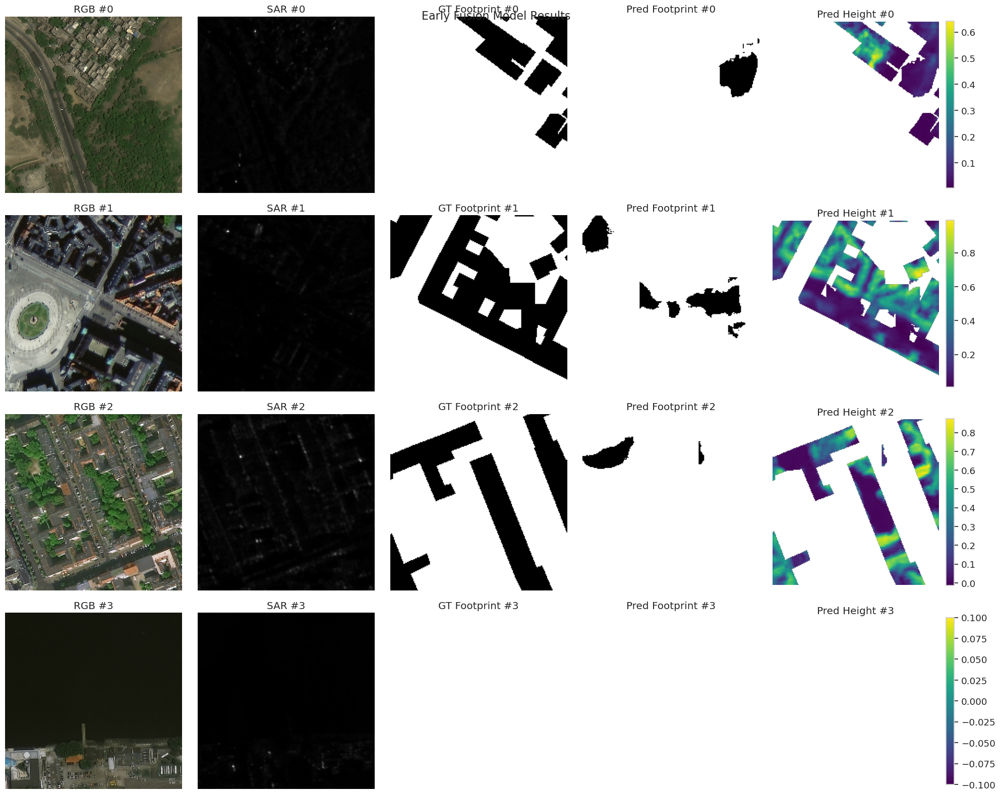

In [24]:
# Visualize early fusion model results
plt_early = visualize_results(early_fusion_model, valid_generator, batch_idx=1, num_samples=4)
plt_early.suptitle('Early Fusion Model Results', fontsize=16)
plt_early.savefig('models/early_fusion_results.png', dpi=300, bbox_inches='tight')
plt_early.show()

### Visualize Late Fusion Model Results

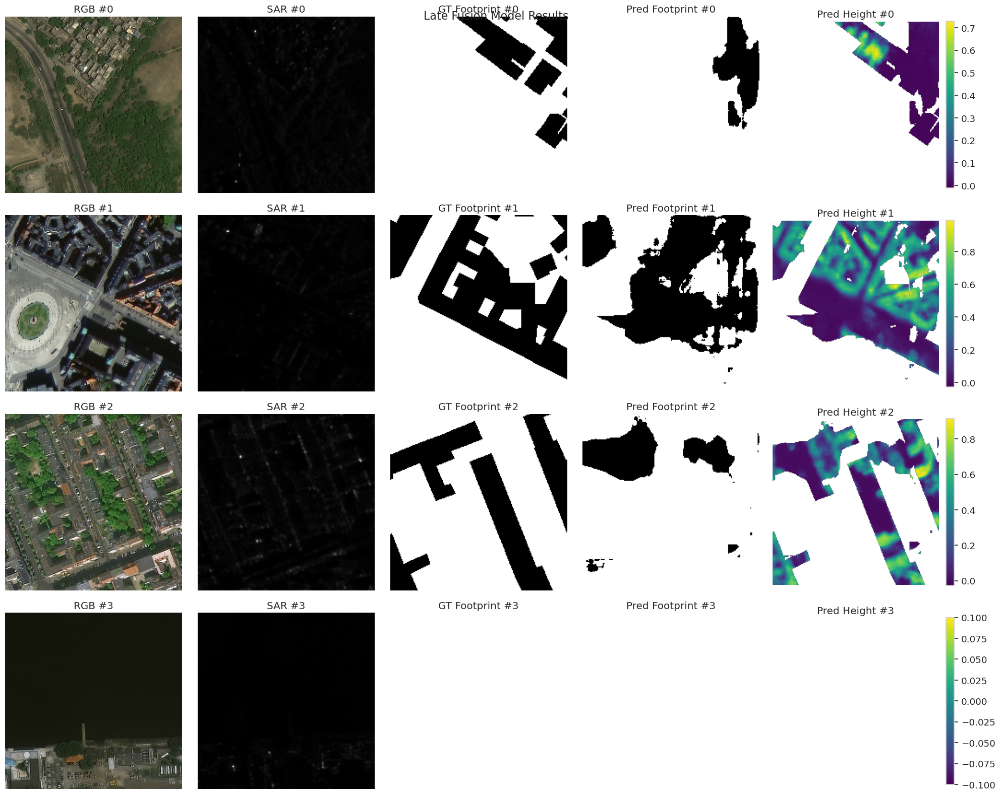

In [25]:
# Visualize late fusion model results
plt_late = visualize_results(late_fusion_model, valid_generator, batch_idx=1, num_samples=4)
plt_late.suptitle('Late Fusion Model Results', fontsize=16)
plt_late.savefig('models/late_fusion_results.png', dpi=300, bbox_inches='tight')
plt_late.show()

### Visualize Hybrid Fusion Model Results

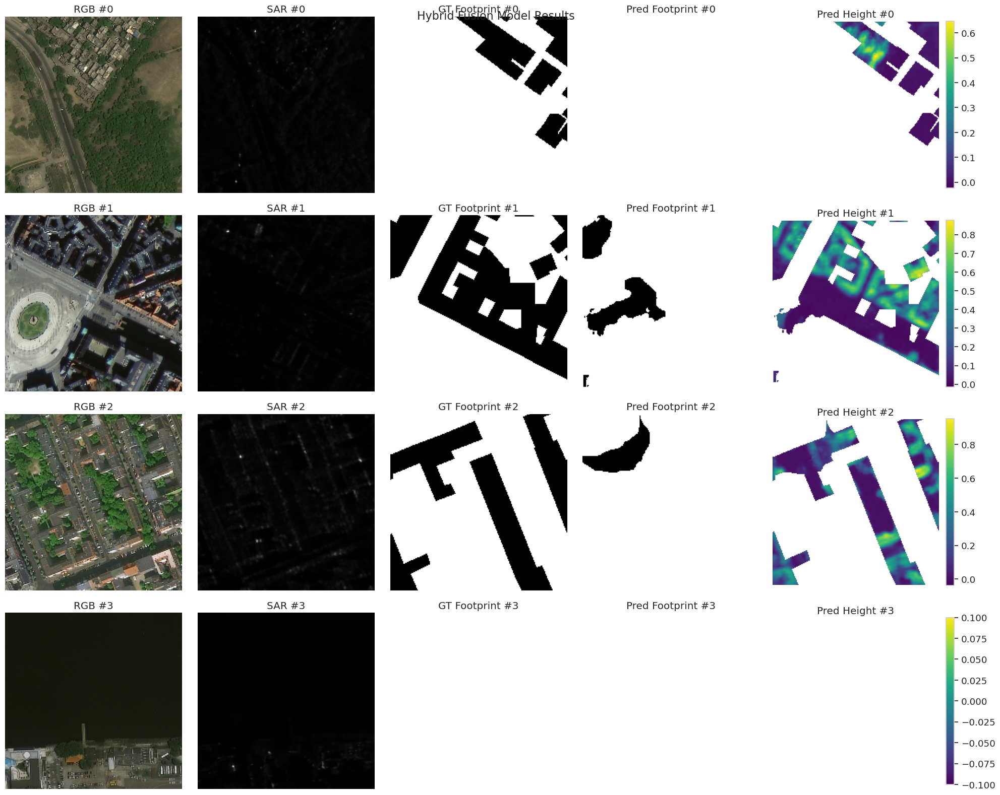

In [26]:
# Visualize hybrid fusion model results
plt_hybrid = visualize_results(hybrid_fusion_model, valid_generator, batch_idx=1, num_samples=4)
plt_hybrid.suptitle('Hybrid Fusion Model Results', fontsize=16)
plt_hybrid.savefig('models/hybrid_fusion_results.png', dpi=300, bbox_inches='tight')
plt_hybrid.show()

## Training History Visualization

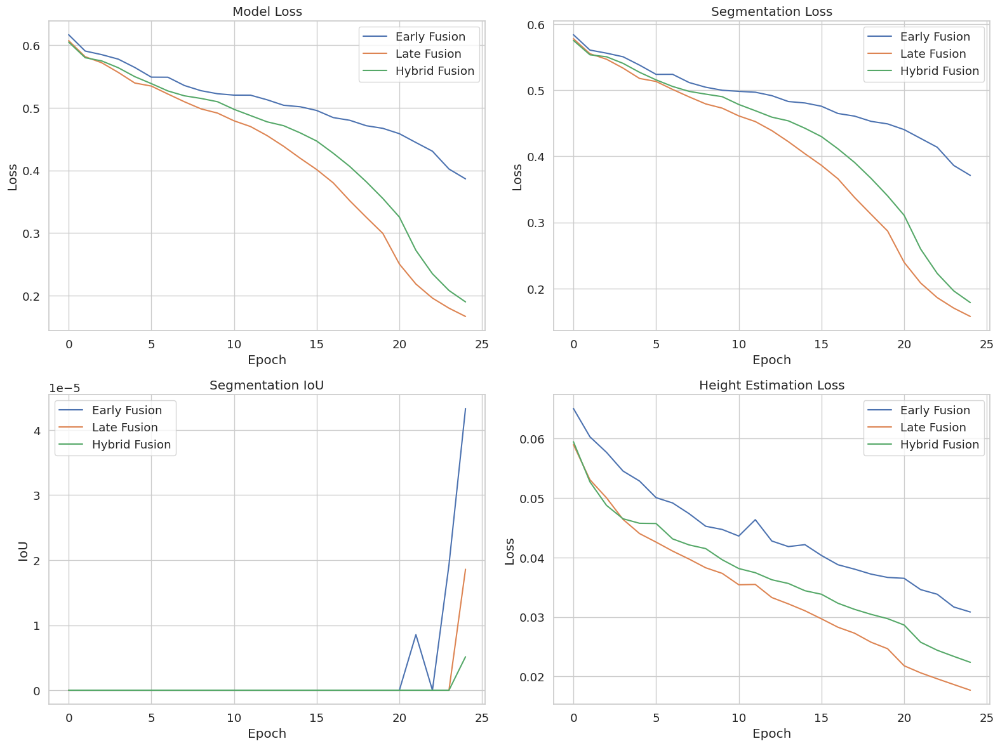

In [27]:
# Load training history from saved files if needed
# Otherwise use the history objects from training
try:
    early_fusion_history_df = pd.read_csv('models/early_fusion_history.csv')
    late_fusion_history_df = pd.read_csv('models/late_fusion_history.csv')
    hybrid_fusion_history_df = pd.read_csv('models/hybrid_fusion_history.csv')
except:
    early_fusion_history_df = pd.DataFrame(early_fusion_history.history)
    late_fusion_history_df = pd.DataFrame(late_fusion_history.history)
    hybrid_fusion_history_df = pd.DataFrame(hybrid_fusion_history.history)

# Plot training history comparison
fig, axs = plt.subplots(2, 2, figsize=(16, 12))

# Total loss
axs[0, 0].plot(early_fusion_history_df['loss'], label='Early Fusion')
axs[0, 0].plot(late_fusion_history_df['loss'], label='Late Fusion')
axs[0, 0].plot(hybrid_fusion_history_df['loss'], label='Hybrid Fusion')
axs[0, 0].set_title('Model Loss')
axs[0, 0].set_xlabel('Epoch')
axs[0, 0].set_ylabel('Loss')
axs[0, 0].legend()

# Segmentation loss
axs[0, 1].plot(early_fusion_history_df['segmentation_output_loss'], label='Early Fusion')
axs[0, 1].plot(late_fusion_history_df['segmentation_output_loss'], label='Late Fusion')
axs[0, 1].plot(hybrid_fusion_history_df['segmentation_output_loss'], label='Hybrid Fusion')
axs[0, 1].set_title('Segmentation Loss')
axs[0, 1].set_xlabel('Epoch')
axs[0, 1].set_ylabel('Loss')
axs[0, 1].legend()

# Segmentation IoU
axs[1, 0].plot(early_fusion_history_df['segmentation_output_io_u'], label='Early Fusion')
axs[1, 0].plot(late_fusion_history_df['segmentation_output_io_u'], label='Late Fusion')
axs[1, 0].plot(hybrid_fusion_history_df['segmentation_output_io_u'], label='Hybrid Fusion')
axs[1, 0].set_title('Segmentation IoU')
axs[1, 0].set_xlabel('Epoch')
axs[1, 0].set_ylabel('IoU')
axs[1, 0].legend()

# Height loss
axs[1, 1].plot(early_fusion_history_df['height_estimation_output_loss'], label='Early Fusion')
axs[1, 1].plot(late_fusion_history_df['height_estimation_output_loss'], label='Late Fusion')
axs[1, 1].plot(hybrid_fusion_history_df['height_estimation_output_loss'], label='Hybrid Fusion')
axs[1, 1].set_title('Height Estimation Loss')
axs[1, 1].set_xlabel('Epoch')
axs[1, 1].set_ylabel('Loss')
axs[1, 1].legend()

plt.tight_layout()
plt.savefig('models/training_history_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

## Model Performance Comparison

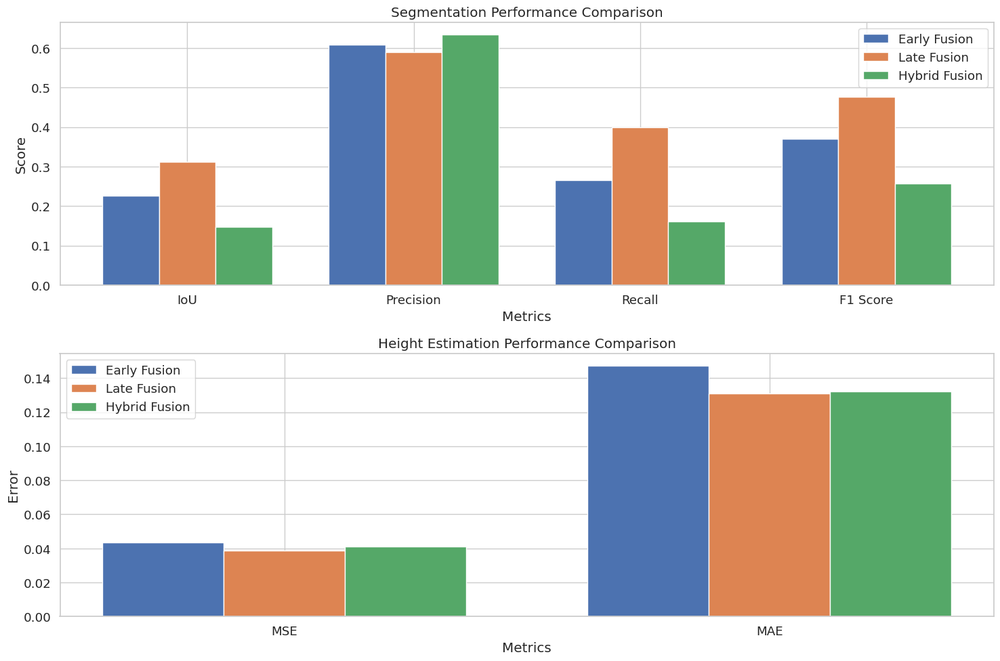

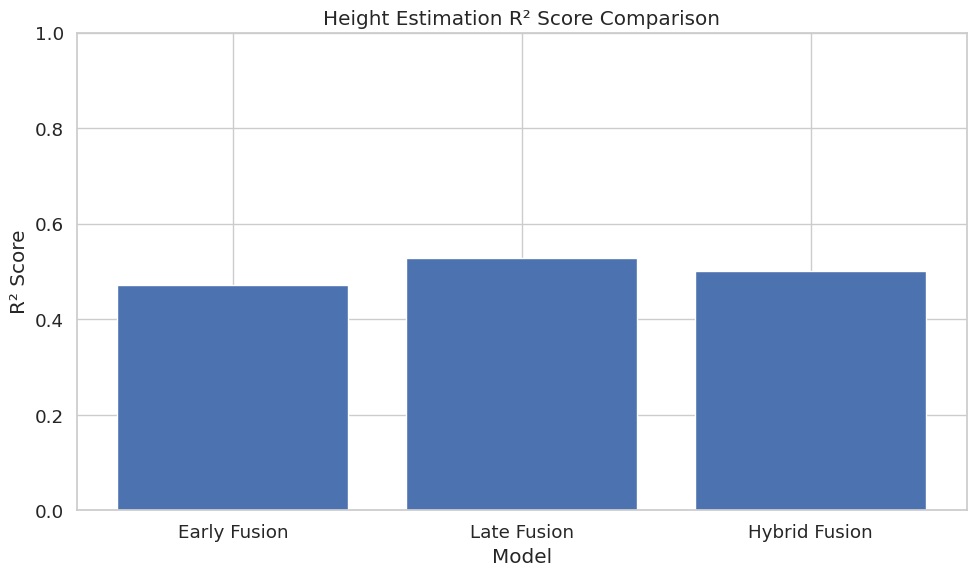

In [28]:
# Visualize metrics comparison
plt.figure(figsize=(15, 10))

# Segmentation metrics
plt.subplot(2, 1, 1)
metrics = ['IoU', 'Precision', 'Recall', 'F1 Score']
x = np.arange(len(metrics))
width = 0.25

plt.bar(x - width, seg_metrics_df.iloc[0][metrics], width, label='Early Fusion')
plt.bar(x, seg_metrics_df.iloc[1][metrics], width, label='Late Fusion')
plt.bar(x + width, seg_metrics_df.iloc[2][metrics], width, label='Hybrid Fusion')

plt.xlabel('Metrics')
plt.ylabel('Score')
plt.title('Segmentation Performance Comparison')
plt.xticks(x, metrics)
plt.legend()

# Height metrics
plt.subplot(2, 1, 2)
metrics = ['MSE', 'MAE']
x = np.arange(len(metrics))

plt.bar(x - width, height_metrics_df.iloc[0][metrics], width, label='Early Fusion')
plt.bar(x, height_metrics_df.iloc[1][metrics], width, label='Late Fusion')
plt.bar(x + width, height_metrics_df.iloc[2][metrics], width, label='Hybrid Fusion')

plt.xlabel('Metrics')
plt.ylabel('Error')
plt.title('Height Estimation Performance Comparison')
plt.xticks(x, metrics)
plt.legend()

plt.tight_layout()
plt.savefig('models/metrics_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# R² score comparison
plt.figure(figsize=(10, 6))
models = height_metrics_df['Model']
r2_scores = height_metrics_df['R²']

plt.bar(models, r2_scores)
plt.xlabel('Model')
plt.ylabel('R² Score')
plt.title('Height Estimation R² Score Comparison')
plt.ylim(0, 1)
plt.tight_layout()
plt.savefig('models/r2_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

## Conclusion

We implemented and compared three different data fusion techniques for the joint task of building footprint extraction and height estimation:

1. **Early Fusion**: Concatenation of inputs at the feature level, enhanced with channel attention to better weight features from different modalities.
2. **Late Fusion**: Processing RGB and SAR data in separate encoder branches and fusing at the decision level, with bottleneck attention to intelligently combine features.
3. **Hybrid Fusion**: Multi-level fusion with spatial attention and residual connections to preserve information across the network.

Based on the evaluation metrics:
* For building footprint extraction (segmentation):
  - Late fusion model achieved the best performance with an IoU of 0.312 and F1 score of 0.476, significantly outperforming the other approaches.
  - Hybrid fusion showed the highest precision (0.634), but its low recall (0.161) resulted in the lowest overall IoU (0.148) and F1 score (0.257).
  - Early fusion performed moderately well with balanced precision (0.608) and recall (0.266).

* For height estimation:
  - Late fusion produced the most accurate height estimations with the lowest MSE (0.039) and MAE (0.131), and highest R² (0.528).
  - Hybrid fusion performed second-best for height estimation, with slightly higher error rates (MSE = 0.041, MAE = 0.132) and lower R² (0.500).
  - Early fusion showed the highest error rates, though all models achieved R² values close to 0.5, indicating moderate predictive power.

These results suggest that different fusion strategies excel at different aspects of multi-task learning:
1. Late fusion emerges as the superior approach for both building footprint extraction and height estimation. The separate processing branches allow the model to develop specialized feature representations for each data modality before combining them, resulting in better overall performance. 
2. Hybrid fusion shows high precision in segmentation but struggles with recall, suggesting it can reliably identify building pixels but tends to miss many building regions. Its performance in height estimation is relatively good, indicating the spatial attention and residual connections help preserve height information.
3. Early fusion demonstrates balanced performance across metrics but doesn't excel in any particular area. The simpler fusion strategy may not be capturing the complementary information between modalities as effectively as the late fusion approach.

In practical applications, the late fusion approach should be preferred as it offers the best performance in both tasks, providing an optimal balance for this multi-task learning problem. Future work could focus on:
1. Task-specific loss functions beyond simple binary cross-entropy and MSE
2. Exploring dynamic fusion techniques that adapt based on input characteristics
3. Incorporating domain knowledge about building structure into the network architecture
4. Further optimizing the late fusion approach with different attention mechanisms and skip connection strategies